# Introduction

# All variables (merging all input dataframe)

## DummyClassifier

In [1]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.dummy import DummyClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
import shap


warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('/Users/maudg1/Documents/OC_P7_Scoring/Home_Credit/application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('/Users/maudg1/Documents/OC_P7_Scoring/Home_Credit/application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('/Users/maudg1/Documents/OC_P7_Scoring/Home_Credit/bureau.csv', nrows = num_rows)
    bb = pd.read_csv('/Users/maudg1/Documents/OC_P7_Scoring/Home_Credit/bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('/Users/maudg1/Documents/OC_P7_Scoring/Home_Credit/previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('/Users/maudg1/Documents/OC_P7_Scoring/Home_Credit/POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
    
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('/Users/maudg1/Documents/OC_P7_Scoring/Home_Credit/installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('/Users/maudg1/Documents/OC_P7_Scoring/Home_Credit/credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg

def check_feature_names(columns):
    # Check for invalid characters in column names
    invalid = [col for col in columns if re.search(r'[^\w\s]', col)]  # Caractères spéciaux détectés
    if invalid:
        print("Invalid column names detected:", invalid)
    return invalid


def main(debug=False):
    num_rows = 10000 if debug else None
        
    # Load the dataset
    df = application_train_test(num_rows)
    
    # Process different tables and join them to the main dataframe
    with timer("Process bureau and bureau_balance"):
        bureau = bureau_and_balance(num_rows)
        df = df.join(bureau, how='left', on='SK_ID_CURR')
        del bureau
        gc.collect()
    
    with timer("Process previous_applications"):
        prev = previous_applications(num_rows)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        del prev
        gc.collect()
    
    with timer("Process POS-CASH balance"):
        pos = pos_cash(num_rows)
        df = df.join(pos, how='left', on='SK_ID_CURR')
        del pos
        gc.collect()
    
    with timer("Process installments payments"):
        ins = installments_payments(num_rows)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        del ins
        gc.collect()
    
    with timer("Process credit card balance"):
        cc = credit_card_balance(num_rows)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        del cc
        gc.collect()

    # Remove problematic columns before training the model
    with timer("Remove invalid columns"):
        columns_to_drop = [
            'CC_NAME_CONTRACT_STATUS_Active_MIN', 'CC_NAME_CONTRACT_STATUS_Active_MAX',
            'CC_NAME_CONTRACT_STATUS_Approved_MIN', 'CC_NAME_CONTRACT_STATUS_Approved_MAX',
            'CC_NAME_CONTRACT_STATUS_Completed_MIN', 'CC_NAME_CONTRACT_STATUS_Completed_MAX',
            'CC_NAME_CONTRACT_STATUS_Demand_MIN', 'CC_NAME_CONTRACT_STATUS_Demand_MAX',
            'CC_NAME_CONTRACT_STATUS_Refused_MIN', 'CC_NAME_CONTRACT_STATUS_Refused_MAX',
            'CC_NAME_CONTRACT_STATUS_Sent proposal_MIN', 'CC_NAME_CONTRACT_STATUS_Sent proposal_MAX',
            'CC_NAME_CONTRACT_STATUS_Signed_MIN', 'CC_NAME_CONTRACT_STATUS_Signed_MAX',
            'CC_NAME_CONTRACT_STATUS_nan_MIN', 'CC_NAME_CONTRACT_STATUS_nan_MAX'
        ]
        df = df.drop(columns=[col for col in columns_to_drop if col in df.columns], errors='ignore')
        df = df.dropna(subset=['TARGET'])

    # Define predictors (feature columns)
    predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
    
    # Define X and y
    X = df[predictors]  # Features (predictors)
    y = df['TARGET']   # Target variable

    # Handle NaN, inf or very large values
    X = X.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
    X = X.fillna(X.mean())  # Fill NaN values with the column mean

    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

    # Define the DummyClassifier with stratified strategy
    dummy_clf = DummyClassifier(strategy="stratified")
    dummy_clf.fit(X_train, y_train)

    # Make predictions and calculate probabilities
    y_pred = dummy_clf.predict(X_test)
    y_proba = dummy_clf.predict_proba(X_test)[:, 1]  # Probabilities for AUC calculation

    # Evaluate the model using different metrics
    auc = roc_auc_score(y_test, y_proba)
    custom_score = custom_metric(y_test, y_pred)

    print(f"AUC: {auc}")
    print(f"Custom Metric Score: {custom_score}")

if __name__ == "__main__":
    with timer("Full model run"):
        main()

Train samples: 307511, test samples: 48744
Process bureau and bureau_balance - done in 32s
Process previous_applications - done in 41s
Process POS-CASH balance - done in 26s
Process installments payments - done in 47s
Process credit card balance - done in 33s
Remove invalid columns - done in 4s
AUC: 0.4987747588031685
Custom Metric Score: 1679
Full model run - done in 287s


## Linear regression

In [11]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, mean_squared_error, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
import mlflow.lightgbm
from flask import Flask
import shap


warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings("ignore", message=".*l1_ratio.*")
warnings.filterwarnings("ignore", message="l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)", category=UserWarning)


# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
    
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg

def check_feature_names(columns):
    # Check for invalid characters in column names
    invalid = [col for col in columns if re.search(r'[^\w\s]', col)]
    if invalid:
        print("Invalid column names detected:", invalid)
    return invalid

# Define the main function
def main(debug=False):
    num_rows = 10000 if debug else None
    
    # Load the dataset
    df = application_train_test(num_rows)
    
    # Process different tables and join them to the main dataframe
    with timer("Process bureau and bureau_balance"):
        bureau = bureau_and_balance(num_rows)
        df = df.join(bureau, how='left', on='SK_ID_CURR')
        del bureau
        gc.collect()
    
    with timer("Process previous_applications"):
        prev = previous_applications(num_rows)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        del prev
        gc.collect()
    
    with timer("Process POS-CASH balance"):
        pos = pos_cash(num_rows)
        df = df.join(pos, how='left', on='SK_ID_CURR')
        del pos
        gc.collect()
    
    with timer("Process installments payments"):
        ins = installments_payments(num_rows)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        del ins
        gc.collect()
    
    with timer("Process credit card balance"):
        cc = credit_card_balance(num_rows)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        del cc
        gc.collect()

    # Remove problematic columns before training the model
    with timer("Remove invalid columns"):
        columns_to_drop = [
            'CC_NAME_CONTRACT_STATUS_Active_MIN', 'CC_NAME_CONTRACT_STATUS_Active_MAX',
            'CC_NAME_CONTRACT_STATUS_Approved_MIN', 'CC_NAME_CONTRACT_STATUS_Approved_MAX',
            'CC_NAME_CONTRACT_STATUS_Completed_MIN', 'CC_NAME_CONTRACT_STATUS_Completed_MAX',
            'CC_NAME_CONTRACT_STATUS_Demand_MIN', 'CC_NAME_CONTRACT_STATUS_Demand_MAX',
            'CC_NAME_CONTRACT_STATUS_Refused_MIN', 'CC_NAME_CONTRACT_STATUS_Refused_MAX',
            'CC_NAME_CONTRACT_STATUS_Sent proposal_MIN', 'CC_NAME_CONTRACT_STATUS_Sent proposal_MAX',
            'CC_NAME_CONTRACT_STATUS_Signed_MIN', 'CC_NAME_CONTRACT_STATUS_Signed_MAX',
            'CC_NAME_CONTRACT_STATUS_nan_MIN', 'CC_NAME_CONTRACT_STATUS_nan_MAX'
        ]
        df = df.drop(columns=[col for col in columns_to_drop if col in df.columns], errors='ignore')
        df = df.dropna(subset=['TARGET'])

    # Define predictors (feature columns)
    predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
    
    # Define X and y
    X = df[predictors]  # Features (predictors)
    y = df['TARGET']   # Target variable

    # Handle NaN, inf or very large values
    X = X.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
    X = X.fillna(X.mean())  # Fill NaN values with the column mean

    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)  # Apply standard scaling to the features

    # Define the Logistic Regression model
    logistic = LogisticRegression(random_state=42, max_iter=500)

    # Define the parameter distribution for RandomizedSearchCV
    param_dist = {
        'C': uniform(0.01, 10),  # Regularization strength
        'penalty': ['l1', 'l2', 'elasticnet'],  # Regularization types
        'solver': ['saga'],  # Solver that supports l1 and elasticnet
        'l1_ratio': uniform(0, 1)  # Only needed when 'penalty' is 'elasticnet'
    }

    # Set up RandomizedSearchCV with multiple metrics
    random_search = RandomizedSearchCV(
        estimator=logistic,
        param_distributions=param_dist,
        n_iter=50,
        scoring='roc_auc',
        cv=5,
        random_state=42,
        n_jobs=-1
    )

    # Fit the RandomizedSearchCV
    random_search.fit(X_scaled, y)

    # Output best parameters and scores
    print(f"Best Parameters: {random_search.best_params_}")
    print(f"Best Cross-Validated AUC: {random_search.best_score_}")

    # Stratified K-Fold Cross Validation
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    auc_scores = []
    mse_scores = []

    for train_index, test_index in skf.split(X_scaled, y):
        X_train, X_test = X_scaled[train_index], X_scaled[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        # Fit Logistic Regression Model
        model = LogisticRegression(random_state=42)
        model.fit(X_train, y_train)
        
        # Predict probabilities and outputs
        y_prob = model.predict_proba(X_test)[:, 1]  # Probability for the positive class
        y_pred = model.predict(X_test)
        
        # Calculate AUC
        auc = roc_auc_score(y_test, y_prob)
        auc_scores.append(auc)
        
        # Calculate MSE
        mse = mean_squared_error(y_test, y_prob)  # Compare true labels with probabilities
        mse_scores.append(mse)
        
        print(f"Fold AUC: {auc:.4f}, Fold MSE: {mse:.4f}")
    
    # Average metrics across folds
    print(f"Average AUC: {np.mean(auc_scores):.4f}")
    print(f"Average MSE: {np.mean(mse_scores):.4f}")

if __name__ == "__main__":
    with timer("Full model run"):
        main()

Train samples: 307511, test samples: 48744
Process bureau and bureau_balance - done in 13s
Process previous_applications - done in 13s
Process POS-CASH balance - done in 8s
Process installments payments - done in 16s
Process credit card balance - done in 10s
Remove invalid columns - done in 1s


/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1197: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1197: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1197: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1197: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1197: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/linear_

KeyboardInterrupt: 

## Linear SVC

In [12]:
# Import LinearSVC
from sklearn.svm import LinearSVC
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import roc_auc_score, confusion_matrix
from scipy.stats import uniform

warnings.simplefilter(action='ignore', category=FutureWarning)


# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
    
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg

def check_feature_names(columns):
    # Check for invalid characters in column names
    invalid = [col for col in columns if re.search(r'[^\w\s]', col)]
    if invalid:
        print("Invalid column names detected:", invalid)
    return invalid

# Define the main function
def main(debug=False):
    num_rows = 10000 if debug else None
    
    # Load the dataset
    df = application_train_test(num_rows)
    
    # Process different tables and join them to the main dataframe
    with timer("Process bureau and bureau_balance"):
        bureau = bureau_and_balance(num_rows)
        df = df.join(bureau, how='left', on='SK_ID_CURR')
        del bureau
        gc.collect()
    
    with timer("Process previous_applications"):
        prev = previous_applications(num_rows)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        del prev
        gc.collect()
    
    with timer("Process POS-CASH balance"):
        pos = pos_cash(num_rows)
        df = df.join(pos, how='left', on='SK_ID_CURR')
        del pos
        gc.collect()
    
    with timer("Process installments payments"):
        ins = installments_payments(num_rows)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        del ins
        gc.collect()
    
    with timer("Process credit card balance"):
        cc = credit_card_balance(num_rows)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        del cc
        gc.collect()

    # Remove problematic columns before training the model
    with timer("Remove invalid columns"):
        columns_to_drop = [
            'CC_NAME_CONTRACT_STATUS_Active_MIN', 'CC_NAME_CONTRACT_STATUS_Active_MAX',
            'CC_NAME_CONTRACT_STATUS_Approved_MIN', 'CC_NAME_CONTRACT_STATUS_Approved_MAX',
            'CC_NAME_CONTRACT_STATUS_Completed_MIN', 'CC_NAME_CONTRACT_STATUS_Completed_MAX',
            'CC_NAME_CONTRACT_STATUS_Demand_MIN', 'CC_NAME_CONTRACT_STATUS_Demand_MAX',
            'CC_NAME_CONTRACT_STATUS_Refused_MIN', 'CC_NAME_CONTRACT_STATUS_Refused_MAX',
            'CC_NAME_CONTRACT_STATUS_Sent proposal_MIN', 'CC_NAME_CONTRACT_STATUS_Sent proposal_MAX',
            'CC_NAME_CONTRACT_STATUS_Signed_MIN', 'CC_NAME_CONTRACT_STATUS_Signed_MAX',
            'CC_NAME_CONTRACT_STATUS_nan_MIN', 'CC_NAME_CONTRACT_STATUS_nan_MAX'
        ]
        df = df.drop(columns=[col for col in columns_to_drop if col in df.columns], errors='ignore')
        df = df.dropna(subset=['TARGET'])

    # Define predictors (feature columns)
    predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
    
    # Define X and y
    X = df[predictors]  # Features (predictors)
    y = df['TARGET']   # Target variable

    # Handle NaN, inf or very large values
    X = X.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
    X = X.fillna(X.mean())  # Fill NaN values with the column mean

    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)  # Apply standard scaling to the features

    # UseLinear SVM
    svc = LinearSVC(random_state=42, dual=False)  # dual=False is recommended when n_samples > n_features
    
    # Parameter distribution for RandomizedSearchCV for Linear SVM
    param_dist = {
        'C': uniform(0.01, 10)  # Regularization parameter
    }
    
    # Set up RandomizedSearchCV
    random_search = RandomizedSearchCV(
        estimator=svc,
        param_distributions=param_dist,
        n_iter=50,
        scoring={'roc_auc': 'roc_auc', 'custom_metric': custom_scorer},  # Multi-metric scoring
        refit='custom_metric',  # Use custom metric for the final model selection
        cv=5,
        random_state=42,
        n_jobs=-1
    )
    
    # Fit the RandomizedSearchCV
    random_search.fit(X_scaled, y)
    
    # Output best parameters and scores
    print(f"Best Parameters: {random_search.best_params_}")
    print(f"Best Cross-Validated AUC: {random_search.cv_results_['mean_test_roc_auc'][random_search.best_index_]}")
    print(f"Best Cross-Validated Custom Score: {random_search.cv_results_['mean_test_custom_metric'][random_search.best_index_]}")
    
    # Stratified K-Fold Cross Validation
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    auc_scores = []
    custom_scores = []
    confusion_matrices = []
    
    for train_index, test_index in skf.split(X_scaled, y):
        X_train, X_test = X_scaled[train_index], X_scaled[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
        # Use the best model from RandomizedSearchCV
        best_svc = random_search.best_estimator_
        best_svc.fit(X_train, y_train)
    
        # Predictions
        decision_scores = best_svc.decision_function(X_test)
        y_pred = (decision_scores > 0).astype(int)  # Threshold at 0
    
        # Evaluate AUC
        auc = roc_auc_score(y_test, decision_scores)
        auc_scores.append(auc)
    
        # Evaluate custom metric
        custom_score = custom_metric(y_test, y_pred)
        custom_scores.append(custom_score)
    
        # Confusion Matrix
        cm = confusion_matrix(y_test, y_pred)
        tn, fp, fn, tp = cm.ravel()
    
        # Store the confusion matrix values for this fold
        confusion_matrices.append({'TP': tp, 'FP': fp, 'TN': tn, 'FN': fn})
    
        print(f"Fold AUC: {auc}, Fold Custom Score: {custom_score}")
    
    # Average AUC score and custom metric across folds
    print(f"Average AUC: {np.mean(auc_scores)}")
    print(f"Average Custom Score: {np.mean(custom_scores)}")
    
    # Average confusion matrix values across folds
    average_confusion = pd.DataFrame(confusion_matrices).mean().astype(int)
    print("\n### Confusion Matrix Summary ###")
    print(f"True Positive (TP): {average_confusion['TP']} | False Positive (FP): {average_confusion['FP']}")
    print(f"True Negative (TN): {average_confusion['TN']} | False Negative (FN): {average_confusion['FN']}")
    
    # Calculate the percentage for each category in the confusion matrix
    total = average_confusion.sum()
    percentages = (average_confusion / total) * 100
    print("\n### Confusion Matrix Percentages ###")
    print(percentages)

if __name__ == "__main__":
    with timer("Full model run"):
        main()


Train samples: 307511, test samples: 48744
Process bureau and bureau_balance - done in 13s
Process previous_applications - done in 13s
Process POS-CASH balance - done in 7s
Process installments payments - done in 15s
Process credit card balance - done in 11s
Remove invalid columns - done in 1s


KeyboardInterrupt: 

## XGBoost

In [13]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
import mlflow.lightgbm
from flask import Flask
import shap


warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Classifying several classes
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification
    
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()
    weight_fp = 1  # Weight for False Positives
    weight_fn = 2  # Weight for False Negatives (more severe)
    return tp - (weight_fp * fp + weight_fn * fn)


# Custom scorer for GridSearchCV
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
    
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg

def check_feature_names(columns):
    # Check for invalid characters in column names
    invalid = [col for col in columns if re.search(r'[^\w\s]', col)]  # Caractères spéciaux détectés
    if invalid:
        print("Invalid column names detected:", invalid)
    return invalid

def custom_cost(y_true, y_proba, cost_fn, threshold=0.5):
    y_pred = (y_proba[:, 1] >= threshold).astype(int)
    FP = np.sum((y_pred == 1) & (y_true == 0))
    FN = np.sum((y_pred == 0) & (y_true == 1))
    return -cost_fn(FP, FN)  # Return negative cost for minimization

def cost_fn(FP, FN):
    return 10 * FN + FP  # Custom cost function

# Create a scorer that can be passed to GridSearchCV
custom_scorer = make_scorer(custom_cost, needs_proba=True, cost_fn=cost_fn)


def main(debug=False):
    num_rows = 10000 if debug else None
        
    # Load the dataset
    df = application_train_test(num_rows)
    
    # Process different tables and join them to the main dataframe
    with timer("Process bureau and bureau_balance"):
        bureau = bureau_and_balance(num_rows)
        df = df.join(bureau, how='left', on='SK_ID_CURR')
        del bureau
        gc.collect()
    
    with timer("Process previous_applications"):
        prev = previous_applications(num_rows)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        del prev
        gc.collect()
    
    with timer("Process POS-CASH balance"):
        pos = pos_cash(num_rows)
        df = df.join(pos, how='left', on='SK_ID_CURR')
        del pos
        gc.collect()
    
    with timer("Process installments payments"):
        ins = installments_payments(num_rows)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        del ins
        gc.collect()
    
    with timer("Process credit card balance"):
        cc = credit_card_balance(num_rows)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        del cc
        gc.collect()

    # Remove problematic columns before training the model
    with timer("Remove invalid columns"):
        columns_to_drop = [
            'CC_NAME_CONTRACT_STATUS_Active_MIN', 'CC_NAME_CONTRACT_STATUS_Active_MAX',
            'CC_NAME_CONTRACT_STATUS_Approved_MIN', 'CC_NAME_CONTRACT_STATUS_Approved_MAX',
            'CC_NAME_CONTRACT_STATUS_Completed_MIN', 'CC_NAME_CONTRACT_STATUS_Completed_MAX',
            'CC_NAME_CONTRACT_STATUS_Demand_MIN', 'CC_NAME_CONTRACT_STATUS_Demand_MAX',
            'CC_NAME_CONTRACT_STATUS_Refused_MIN', 'CC_NAME_CONTRACT_STATUS_Refused_MAX',
            'CC_NAME_CONTRACT_STATUS_Sent proposal_MIN', 'CC_NAME_CONTRACT_STATUS_Sent proposal_MAX',
            'CC_NAME_CONTRACT_STATUS_Signed_MIN', 'CC_NAME_CONTRACT_STATUS_Signed_MAX',
            'CC_NAME_CONTRACT_STATUS_nan_MIN', 'CC_NAME_CONTRACT_STATUS_nan_MAX'
        ]
        df = df.drop(columns=[col for col in columns_to_drop if col in df.columns], errors='ignore')
        df = df.dropna(subset=['TARGET'])

    # Define predictors (feature columns)
    predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]  # Adjust this list as necessary
    
    # Define X and y
    X = df[predictors]  # Features (predictors)
    y = df['TARGET']   # Target variable

    # Handle NaN, inf or very large values
    X = X.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
    X = X.fillna(X.mean())  # Fill NaN values with the column mean

    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)  # Apply standard scaling to the features

    # Define the model
    xgb = XGBClassifier(random_state=42)

    # Define the parameter distribution for RandomizedSearchCV
    param_dist = {
        'n_estimators': randint(50, 200),
        'max_depth': randint(3, 15),
        'learning_rate': uniform(0.01, 0.2),
        'subsample': uniform(0.8, 0.2),
        'colsample_bytree': uniform(0.8, 0.2),
        'reg_alpha': uniform(0, 0.1),
        'reg_lambda': uniform(1, 5)
    }

    # Set up RandomizedSearchCV
    random_search = RandomizedSearchCV(
        estimator=xgb,
        param_distributions=param_dist,
        n_iter=50,
        scoring='roc_auc',
        cv=5,
        random_state=42,
        n_jobs=-1
    )

    # Fit the RandomizedSearchCV
    random_search.fit(X_scaled, y)

    # Output best parameters and scores
    print(f"Best Parameters: {random_search.best_params_}")
    print(f"Best Cross-Validated AUC: {random_search.best_score_}")

    # Stratified K-Fold Cross Validation (Optional, to evaluate the final model)
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    auc_scores = []

    for train_index, test_index in skf.split(X_scaled, y):
        X_train, X_test = X_scaled[train_index], X_scaled[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Use the best model from RandomizedSearchCV
        best_xgb = random_search.best_estimator_
        best_xgb.fit(X_train, y_train)

        # Predictions
        y_pred_prob = best_xgb.predict_proba(X_test)[:, 1]

        # Evaluate AUC
        auc = roc_auc_score(y_test, y_pred_prob)
        auc_scores.append(auc)

        print(f"Fold AUC: {auc}")

    # Average AUC score across folds
    print(f"Average AUC: {np.mean(auc_scores)}")

if __name__ == "__main__":
    with timer("Full model run"):
        main()

Train samples: 307511, test samples: 48744
Process bureau and bureau_balance - done in 12s
Process previous_applications - done in 12s
Process POS-CASH balance - done in 7s
Process installments payments - done in 14s
Process credit card balance - done in 10s
Remove invalid columns - done in 1s


/opt/conda/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best Parameters: {'colsample_bytree': np.float64(0.995170415892507), 'learning_rate': np.float64(0.11326006966023906), 'max_depth': 5, 'n_estimators': 194, 'reg_alpha': np.float64(0.03988209014447946), 'reg_lambda': np.float64(3.16760368790371), 'subsample': np.float64(0.9488085285998231)}
Best Cross-Validated AUC: 0.785168490349059
Fold AUC: 0.7813841699723025
Fold AUC: 0.7932068548324396
Fold AUC: 0.7836207581412893
Fold AUC: 0.7863585586583088
Fold AUC: 0.7834153119523092
Average AUC: 0.7855971307113299
Full model run - done in 1899s


### Adding custom score

Train samples: 307511, test samples: 48744
Process bureau and bureau_balance - done in 12s
Process previous_applications - done in 12s
Process POS-CASH balance - done in 7s
Process installments payments - done in 15s
Process credit card balance - done in 10s
Remove invalid columns - done in 1s


/opt/conda/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best Parameters: {'colsample_bytree': np.float64(0.9392608545679577), 'learning_rate': np.float64(0.15245411798488842), 'max_depth': 7, 'n_estimators': 162, 'reg_alpha': np.float64(0.09977404850489419), 'reg_lambda': np.float64(2.333905071376425), 'subsample': np.float64(0.9953229911665307)}
Best Cross-Validated AUC: 0.7782425605163372
Best Cross-Validated Custom Score: 9171.2
Fold AUC: 0.7781782860838434, Fold Custom Score: 9242
Fold AUC: 0.7856722102028346, Fold Custom Score: 9288
Fold AUC: 0.7792857345411085, Fold Custom Score: 9269
Fold AUC: 0.7819523241151338, Fold Custom Score: 9425
Fold AUC: 0.7783501900454732, Fold Custom Score: 9119
Average AUC: 0.7806877489976787
Average Custom Score: 9268.6

### Confusion Matrix Summary ###
True Positive (TP): 262 | False Positive (FP): 253
True Negative (TN): 56283 | False Negative (FN): 4702

### Confusion Matrix Percentages ###
TP     0.426016
FP     0.411382
TN    91.517073
FN     7.645528
dtype: float64
                                 

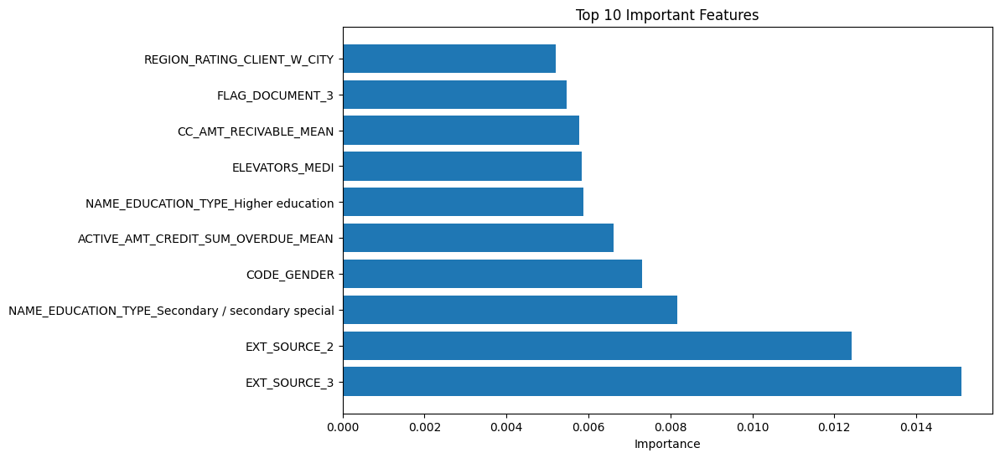

Expected value: -2.5212739


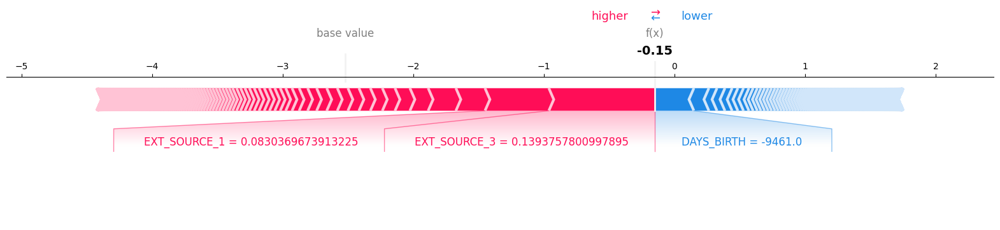

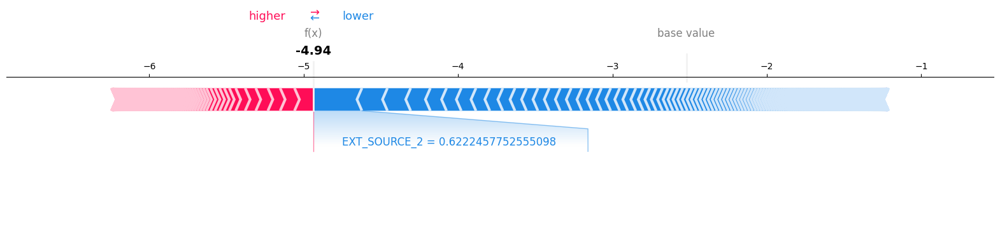

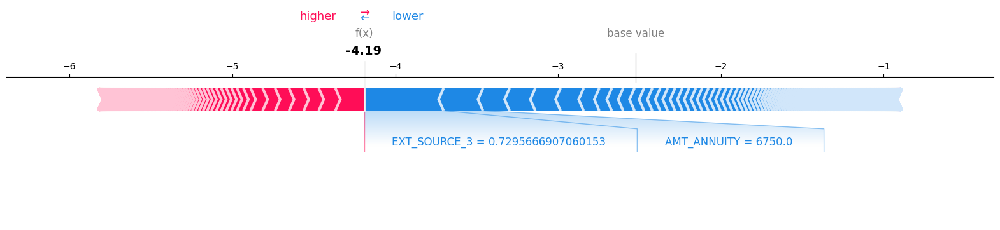

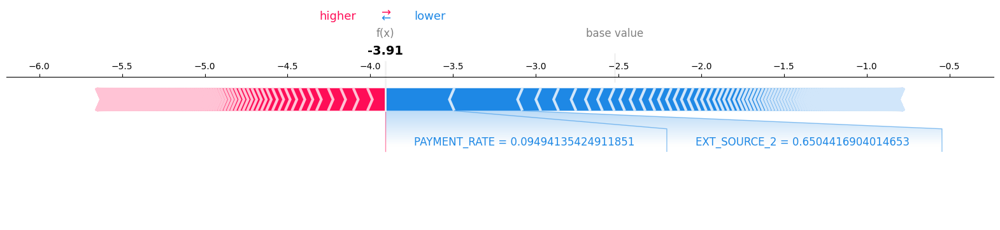

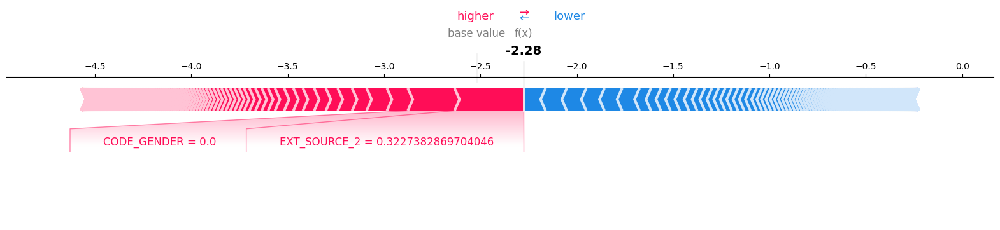

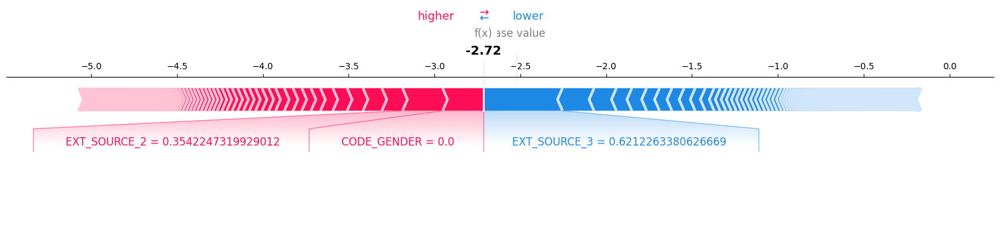

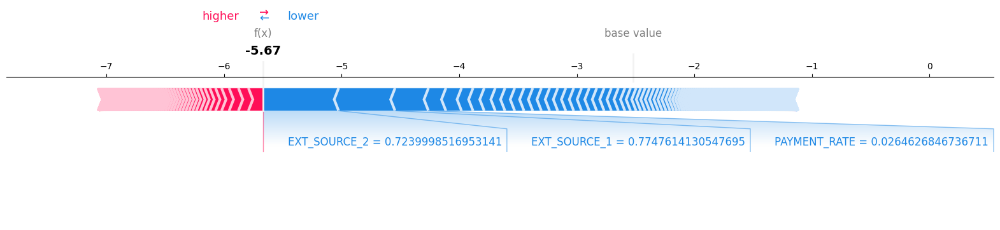

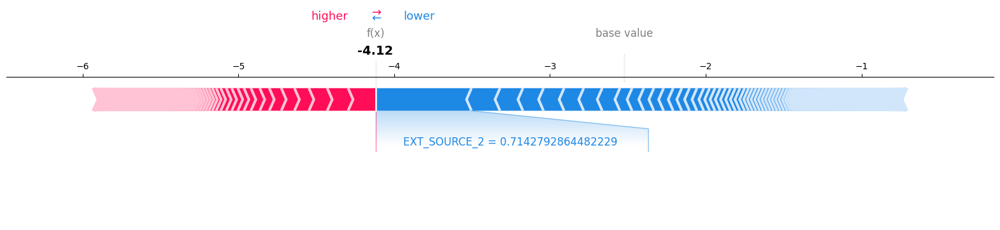

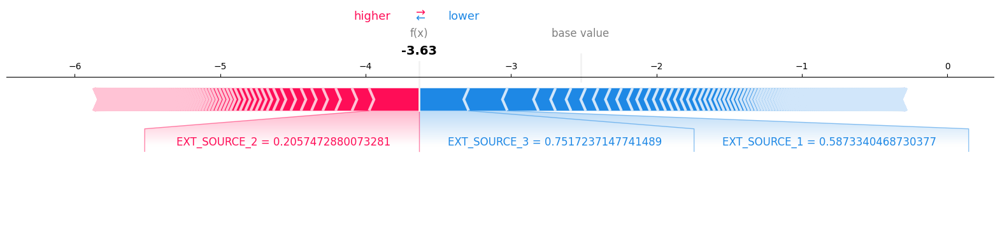

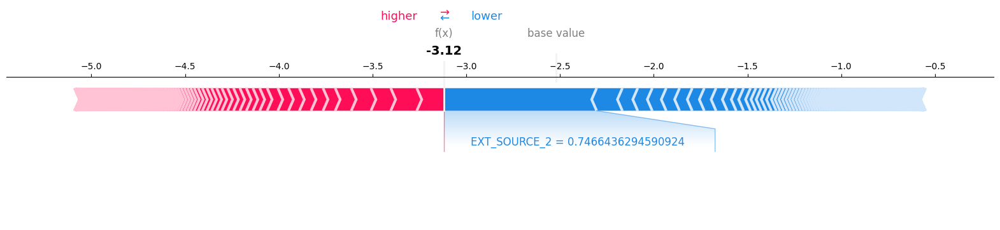

Full model run - done in 1952s


In [14]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
import mlflow.lightgbm
from flask import Flask
import shap


warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
    
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg

def check_feature_names(columns):
    # Check for invalid characters in column names
    invalid = [col for col in columns if re.search(r'[^\w\s]', col)]
    if invalid:
        print("Invalid column names detected:", invalid)
    return invalid


# Main function
def main(debug=False):
    num_rows = 10000 if debug else None
        
    # Load the dataset
    df = application_train_test(num_rows)
    
    # Process different tables and join them to the main dataframe
    with timer("Process bureau and bureau_balance"):
        bureau = bureau_and_balance(num_rows)
        df = df.join(bureau, how='left', on='SK_ID_CURR')
        del bureau
        gc.collect()
    
    with timer("Process previous_applications"):
        prev = previous_applications(num_rows)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        del prev
        gc.collect()
    
    with timer("Process POS-CASH balance"):
        pos = pos_cash(num_rows)
        df = df.join(pos, how='left', on='SK_ID_CURR')
        del pos
        gc.collect()
    
    with timer("Process installments payments"):
        ins = installments_payments(num_rows)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        del ins
        gc.collect()
    
    with timer("Process credit card balance"):
        cc = credit_card_balance(num_rows)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        del cc
        gc.collect()

    # Remove problematic columns before training the model
    with timer("Remove invalid columns"):
        columns_to_drop = [
            'CC_NAME_CONTRACT_STATUS_Active_MIN', 'CC_NAME_CONTRACT_STATUS_Active_MAX',
            'CC_NAME_CONTRACT_STATUS_Approved_MIN', 'CC_NAME_CONTRACT_STATUS_Approved_MAX',
            'CC_NAME_CONTRACT_STATUS_Completed_MIN', 'CC_NAME_CONTRACT_STATUS_Completed_MAX',
            'CC_NAME_CONTRACT_STATUS_Demand_MIN', 'CC_NAME_CONTRACT_STATUS_Demand_MAX',
            'CC_NAME_CONTRACT_STATUS_Refused_MIN', 'CC_NAME_CONTRACT_STATUS_Refused_MAX',
            'CC_NAME_CONTRACT_STATUS_Sent proposal_MIN', 'CC_NAME_CONTRACT_STATUS_Sent proposal_MAX',
            'CC_NAME_CONTRACT_STATUS_Signed_MIN', 'CC_NAME_CONTRACT_STATUS_Signed_MAX',
            'CC_NAME_CONTRACT_STATUS_nan_MIN', 'CC_NAME_CONTRACT_STATUS_nan_MAX'
        ]
        df = df.drop(columns=[col for col in columns_to_drop if col in df.columns], errors='ignore')
        df = df.dropna(subset=['TARGET'])

    # Define predictors (feature columns)
    predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
    
    # Define X and y
    X = df[predictors]  # Features (predictors)
    y = df['TARGET']   # Target variable

    # Handle NaN, inf or very large values
    X = X.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
    X = X.fillna(X.mean())  # Fill NaN values with the column mean

    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)  # Apply standard scaling to the features

    # Define the model
    xgb = XGBClassifier(random_state=42)  # Removed use_label_encoder=False

    # Define the parameter distribution for RandomizedSearchCV
    param_dist = {
        'n_estimators': randint(50, 200),
        'max_depth': randint(3, 15),
        'learning_rate': uniform(0.01, 0.2),
        'subsample': uniform(0.8, 0.2),
        'colsample_bytree': uniform(0.8, 0.2),
        'reg_alpha': uniform(0, 0.1),
        'reg_lambda': uniform(1, 5)
    }

    # Set up RandomizedSearchCV with multiple metrics
    random_search = RandomizedSearchCV(
        estimator=xgb,
        param_distributions=param_dist,
        n_iter=50,
        scoring={'roc_auc': 'roc_auc', 'custom_metric': custom_scorer},  # Multi-metric scoring
        refit='custom_metric',  # Use custom metric for the final model selection
        cv=5,
        random_state=42,
        n_jobs=-1
    )

    # Fit the RandomizedSearchCV
    random_search.fit(X_scaled, y)

    # Output best parameters and scores
    print(f"Best Parameters: {random_search.best_params_}")
    print(f"Best Cross-Validated AUC: {random_search.cv_results_['mean_test_roc_auc'][random_search.best_index_]}")
    print(f"Best Cross-Validated Custom Score: {random_search.cv_results_['mean_test_custom_metric'][random_search.best_index_]}")

    # Stratified K-Fold Cross Validation
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    auc_scores = []
    custom_scores = []
    confusion_matrices = []  # List to store TP, FP, TN, FN for each fold

    for train_index, test_index in skf.split(X_scaled, y):
        X_train, X_test = X_scaled[train_index], X_scaled[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Use the best model from RandomizedSearchCV
        best_xgb = random_search.best_estimator_
        best_xgb.fit(X_train, y_train)

        # Predictions
        y_pred_prob = best_xgb.predict_proba(X_test)[:, 1]
        y_pred = best_xgb.predict(X_test)

        # Evaluate AUC
        auc = roc_auc_score(y_test, y_pred_prob)
        auc_scores.append(auc)

        # Evaluate custom metric
        custom_score = custom_metric(y_test, y_pred)
        custom_scores.append(custom_score)

        # Confusion Matrix
        cm = confusion_matrix(y_test, y_pred)
        tn, fp, fn, tp = cm.ravel()

        # Store the confusion matrix values for this fold
        confusion_matrices.append({'TP': tp, 'FP': fp, 'TN': tn, 'FN': fn})

        print(f"Fold AUC: {auc}, Fold Custom Score: {custom_score}")

    # Average AUC score and custom metric across folds
    print(f"Average AUC: {np.mean(auc_scores)}")
    print(f"Average Custom Score: {np.mean(custom_scores)}")

    # Average confusion matrix values across folds
    average_confusion = pd.DataFrame(confusion_matrices).mean().astype(int)
    print("\n### Confusion Matrix Summary ###")
    print(f"True Positive (TP): {average_confusion['TP']} | False Positive (FP): {average_confusion['FP']}")
    print(f"True Negative (TN): {average_confusion['TN']} | False Negative (FN): {average_confusion['FN']}")

    # Calculate the percentage for each category in the confusion matrix
    total = average_confusion.sum()
    percentages = (average_confusion / total) * 100
    print("\n### Confusion Matrix Percentages ###")
    print(percentages)

    # After fitting the model with RandomizedSearchCV
    best_xgb = random_search.best_estimator_
    
    # Get feature importances from the best XGBoost model
    importances = best_xgb.feature_importances_
    
    # Create a DataFrame with the feature names and their importance scores
    features_df = pd.DataFrame({
        'Feature': X.columns,
        'Importance': importances
    })
    
    # Sort the DataFrame by the importance values in descending order
    features_df = features_df.sort_values(by='Importance', ascending=False)
    
    # Display the top 10 features with the highest importance
    print(features_df.head(10))
    
    # Plot the feature importances
    plt.figure(figsize=(10, 6))
    plt.barh(features_df['Feature'][:10], features_df['Importance'][:10])
    plt.xlabel('Importance')
    plt.title('Top 10 Important Features')
    plt.show()

    # SHAP's TreeExplainer to explain the LightGBM model
    explainer = shap.TreeExplainer(best_xgb)

    # Calculate SHAP values for the dataset
    # Initialize SHAP JS for interactive plots
    shap.initjs()

    # shap_values is a list: [class_0_values, class_1_values] for binary classification
    shap_values = explainer.shap_values(X_scaled)
    print("Expected value:", explainer.expected_value)
    
    # Generate a force plot for a specific instance (example: the first row)
    instance_idx = 0  # Index of the row to explain
    shap.force_plot(
        explainer.expected_value,  # Base value
        shap_values[instance_idx],  # SHAP values for the instance
        X.iloc[instance_idx],  # Feature values for the instance
        feature_names=X.columns.tolist()  # Column names for better readability
    )
    
    # Generate force plots for the first 10 rows
    for row_idx in range(10):  # First 10 rows
        shap.force_plot(
            explainer.expected_value,  # Base value
            shap_values[row_idx],  # SHAP values for the row
            X.iloc[row_idx],  # Feature values for the row
            feature_names=X.columns.tolist(),
            matplotlib=True  # Use Matplotlib for rendering
        )
        
if __name__ == "__main__":
    with timer("Full model run"):
        main()

### Features importances - Threshold 0,006

Train samples: 307511, test samples: 48744
Process bureau and bureau_balance - done in 12s
Process previous_applications - done in 12s
Process POS-CASH balance - done in 7s
Process installments payments - done in 15s
Process credit card balance - done in 10s
Remove invalid columns - done in 1s
Selected features (importance > 0.006): ['EXT_SOURCE_3', 'EXT_SOURCE_2', 'NAME_EDUCATION_TYPE_Higher education', 'NAME_EDUCATION_TYPE_Secondary / secondary special', 'FLAG_DOCUMENT_3', 'CODE_GENDER', 'CC_CNT_DRAWINGS_ATM_CURRENT_MEAN', 'NAME_INCOME_TYPE_Working']
Feature selection based on importance threshold - done in 9s
Best Parameters: {'colsample_bytree': np.float64(0.9173502331327696), 'learning_rate': np.float64(0.2030510614528276), 'max_depth': 14, 'n_estimators': 173, 'reg_alpha': np.float64(0.02759991820225434), 'reg_lambda': np.float64(2.481367528520412), 'subsample': np.float64(0.8330533878126005)}
Best Cross-Validated AUC: 0.6680792572906962
Best Cross-Validated Custom Score: 7757.8


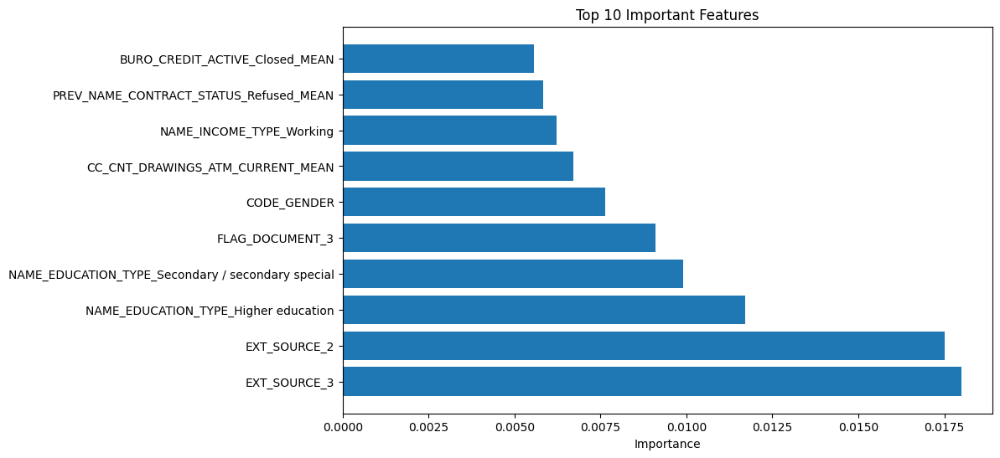

Full model run - done in 121s


In [15]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
import mlflow.lightgbm
from flask import Flask


warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
    
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg

def check_feature_names(columns):
    # Check for invalid characters in column names
    invalid = [col for col in columns if re.search(r'[^\w\s]', col)]  # Caractères spéciaux détectés
    if invalid:
        print("Invalid column names detected:", invalid)
    return invalid

# Main function
def main(debug=False):
    num_rows = 10000 if debug else None
        
    # Load the dataset
    df = application_train_test(num_rows)
    
    # Process different tables and join them to the main dataframe
    with timer("Process bureau and bureau_balance"):
        bureau = bureau_and_balance(num_rows)
        df = df.join(bureau, how='left', on='SK_ID_CURR')
        del bureau
        gc.collect()
    
    with timer("Process previous_applications"):
        prev = previous_applications(num_rows)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        del prev
        gc.collect()
    
    with timer("Process POS-CASH balance"):
        pos = pos_cash(num_rows)
        df = df = df.join(pos, how='left', on='SK_ID_CURR')
        del pos
        gc.collect()
    
    with timer("Process installments payments"):
        ins = installments_payments(num_rows)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        del ins
        gc.collect()
    
    with timer("Process credit card balance"):
        cc = credit_card_balance(num_rows)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        del cc
        gc.collect()

    # Remove problematic columns before training the model
    with timer("Remove invalid columns"):
        columns_to_drop = [
            'CC_NAME_CONTRACT_STATUS_Active_MIN', 'CC_NAME_CONTRACT_STATUS_Active_MAX',
            'CC_NAME_CONTRACT_STATUS_Approved_MIN', 'CC_NAME_CONTRACT_STATUS_Approved_MAX',
            'CC_NAME_CONTRACT_STATUS_Completed_MIN', 'CC_NAME_CONTRACT_STATUS_Completed_MAX',
            'CC_NAME_CONTRACT_STATUS_Demand_MIN', 'CC_NAME_CONTRACT_STATUS_Demand_MAX',
            'CC_NAME_CONTRACT_STATUS_Refused_MIN', 'CC_NAME_CONTRACT_STATUS_Refused_MAX',
            'CC_NAME_CONTRACT_STATUS_Sent proposal_MIN', 'CC_NAME_CONTRACT_STATUS_Sent proposal_MAX',
            'CC_NAME_CONTRACT_STATUS_Signed_MIN', 'CC_NAME_CONTRACT_STATUS_Signed_MAX',
            'CC_NAME_CONTRACT_STATUS_nan_MIN', 'CC_NAME_CONTRACT_STATUS_nan_MAX'
        ]
        df = df.drop(columns=[col for col in columns_to_drop if col in df.columns], errors='ignore')
        df = df.dropna(subset=['TARGET'])

    # Define predictors (feature columns)
    predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
    
    # Define X and y
    X = df[predictors]  # Features (predictors)
    y = df['TARGET']   # Target variable

    # Handle NaN, inf or very large values
    X = X.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
    X = X.fillna(X.mean())  # Fill NaN values with the column mean

    # **Feature Importance-Based Selection**
    with timer("Feature selection based on importance threshold"):
        # Train an initial model to get feature importances
        xgb_initial = XGBClassifier(random_state=42)
        xgb_initial.fit(X, y)

        # Get feature importances and sort them
        importances = xgb_initial.feature_importances_
        features_df = pd.DataFrame({
            'Feature': X.columns,
            'Importance': importances
        })
        features_df = features_df.sort_values(by='Importance', ascending=False)

        # Set the threshold for feature importance
        threshold = 0.006  # Threshold
        selected_features = features_df[features_df['Importance'] > threshold]['Feature'].tolist()

        print(f"Selected features (importance > {threshold}): {selected_features}")
        
        # Use only the selected features
        X = X[selected_features]

    # Scale selected features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Define the model
    xgb = XGBClassifier(random_state=42)

    # Define the parameter distribution for RandomizedSearchCV
    param_dist = {
        'n_estimators': randint(50, 200),
        'max_depth': randint(3, 15),
        'learning_rate': uniform(0.01, 0.2),
        'subsample': uniform(0.8, 0.2),
        'colsample_bytree': uniform(0.8, 0.2),
        'reg_alpha': uniform(0, 0.1),
        'reg_lambda': uniform(1, 5)
    }

    # Set up RandomizedSearchCV with multiple metrics
    random_search = RandomizedSearchCV(
        estimator=xgb,
        param_distributions=param_dist,
        n_iter=50,
        scoring={'roc_auc': 'roc_auc', 'custom_metric': custom_scorer},
        refit='custom_metric',
        cv=5,
        random_state=42,
        n_jobs=-1
    )

    # Fit the RandomizedSearchCV
    random_search.fit(X_scaled, y)

    # Output best parameters and scores
    print(f"Best Parameters: {random_search.best_params_}")
    print(f"Best Cross-Validated AUC: {random_search.cv_results_['mean_test_roc_auc'][random_search.best_index_]}")
    print(f"Best Cross-Validated Custom Score: {random_search.cv_results_['mean_test_custom_metric'][random_search.best_index_]}")

    # Evaluate the final model
    best_xgb = random_search.best_estimator_
    y_pred = best_xgb.predict(X_scaled)
    
    # Compute the confusion matrix
    cm = confusion_matrix(y, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Calculate the counts and percentages
    total = tn + fp + fn + tp
    metrics_df = pd.DataFrame({
        'Metric': ['True Positives', 'False Positives', 'True Negatives', 'False Negatives'],
        'Count': [tp, fp, tn, fn],
        'Percentage': [tp / total, fp / total, tn / total, fn / total]
    })

    # Display the metrics
    print("Confusion Matrix Metrics:")
    print(metrics_df)
    
    # Display selected feature importance
    plt.figure(figsize=(10, 6))
    plt.barh(features_df['Feature'][:10], features_df['Importance'][:10])
    plt.xlabel('Importance')
    plt.title('Top 10 Important Features')
    plt.show()

if __name__ == "__main__":
    with timer("Full model run"):
        main()

### Features importances - Threshold 0,004

Train samples: 307511, test samples: 48744
Process bureau and bureau_balance - done in 13s
Process previous_applications - done in 12s
Process POS-CASH balance - done in 7s
Process installments payments - done in 17s
Process credit card balance - done in 10s
Remove invalid columns - done in 1s
Selected features (importance > 0.004): ['EXT_SOURCE_3', 'EXT_SOURCE_2', 'NAME_EDUCATION_TYPE_Higher education', 'NAME_EDUCATION_TYPE_Secondary / secondary special', 'FLAG_DOCUMENT_3', 'CODE_GENDER', 'CC_CNT_DRAWINGS_ATM_CURRENT_MEAN', 'NAME_INCOME_TYPE_Working', 'PREV_NAME_CONTRACT_STATUS_Refused_MEAN', 'BURO_CREDIT_ACTIVE_Closed_MEAN', 'EXT_SOURCE_1', 'CC_AMT_BALANCE_MEAN', 'DAYS_EMPLOYED', 'OWN_CAR_AGE', 'INSTAL_DPD_MEAN', 'INSTAL_AMT_PAYMENT_SUM']
Feature selection based on importance threshold - done in 10s
Best Parameters: {'colsample_bytree': np.float64(0.9173502331327696), 'learning_rate': np.float64(0.2030510614528276), 'max_depth': 14, 'n_estimators': 173, 'reg_alpha': np.float64(0.0275

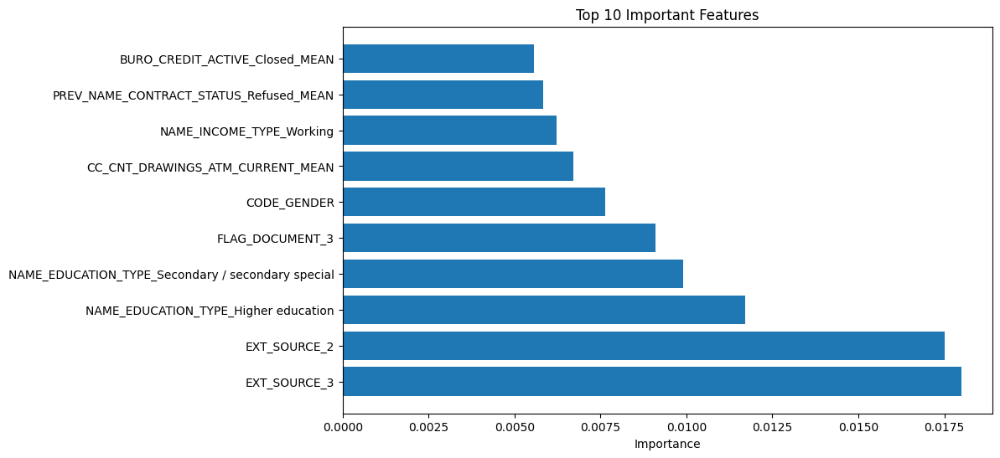

Expected value: -2.5224326


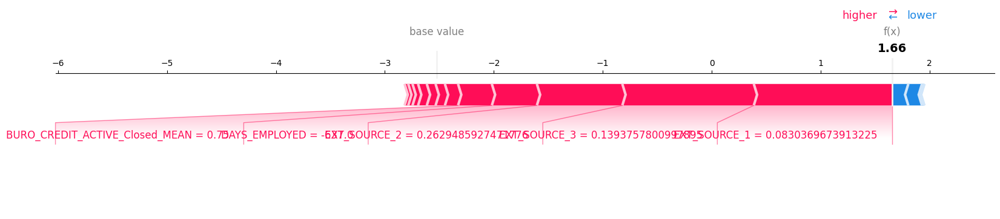

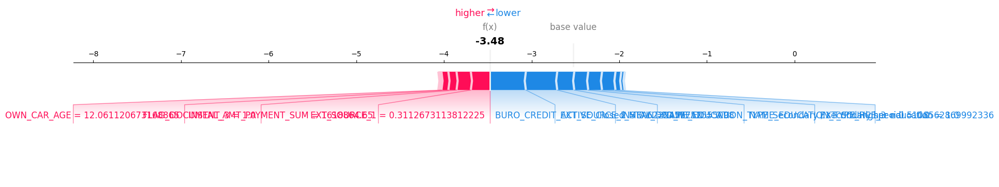

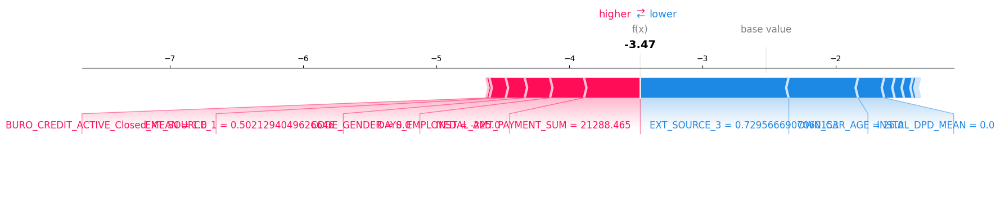

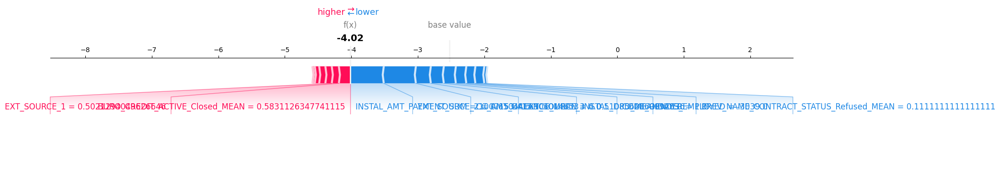

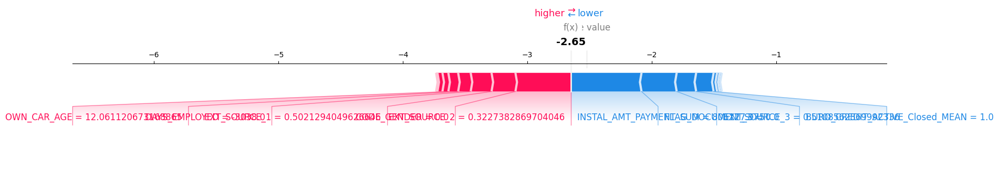

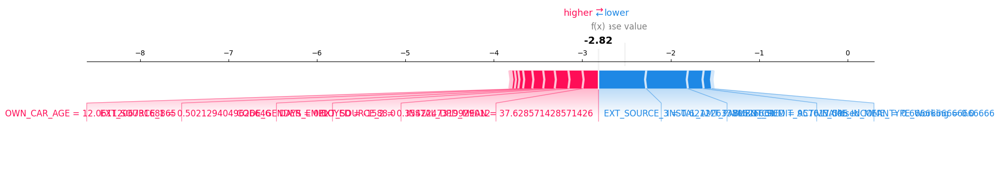

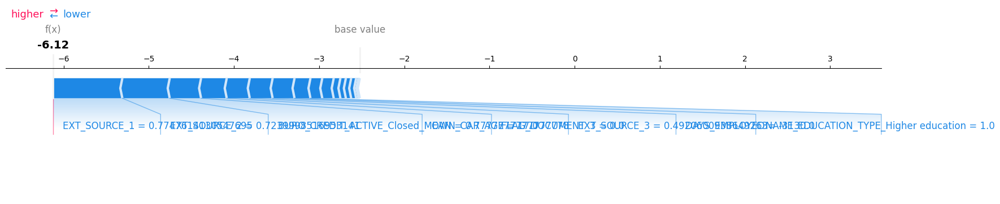

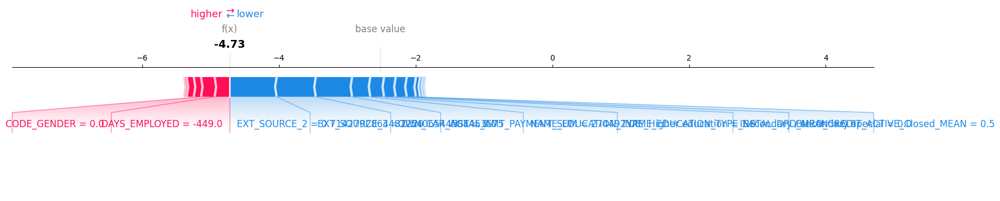

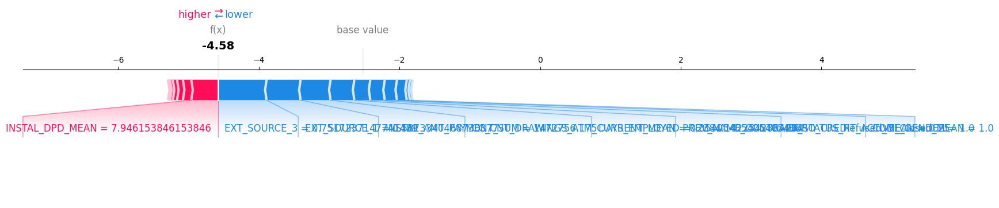

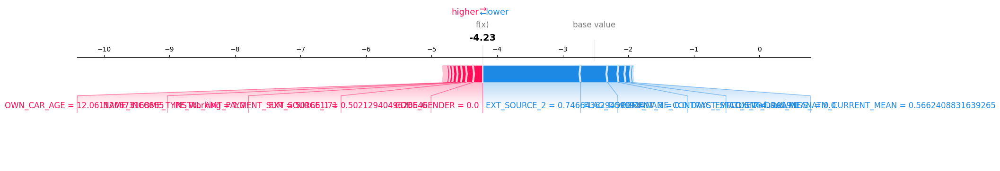

Full model run - done in 743s


In [16]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
import mlflow.lightgbm
from flask import Flask


warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
    
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg

def check_feature_names(columns):
    # Check for invalid characters in column names
    invalid = [col for col in columns if re.search(r'[^\w\s]', col)]
    if invalid:
        print("Invalid column names detected:", invalid)
    return invalid

# Main function
def main(debug=False):
    num_rows = 10000 if debug else None
        
    # Load the dataset
    df = application_train_test(num_rows)
    
    # Process different tables and join them to the main dataframe
    with timer("Process bureau and bureau_balance"):
        bureau = bureau_and_balance(num_rows)
        df = df.join(bureau, how='left', on='SK_ID_CURR')
        del bureau
        gc.collect()
    
    with timer("Process previous_applications"):
        prev = previous_applications(num_rows)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        del prev
        gc.collect()
    
    with timer("Process POS-CASH balance"):
        pos = pos_cash(num_rows)
        df = df = df.join(pos, how='left', on='SK_ID_CURR')
        del pos
        gc.collect()
    
    with timer("Process installments payments"):
        ins = installments_payments(num_rows)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        del ins
        gc.collect()
    
    with timer("Process credit card balance"):
        cc = credit_card_balance(num_rows)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        del cc
        gc.collect()

    # Remove problematic columns before training the model
    with timer("Remove invalid columns"):
        columns_to_drop = [
            'CC_NAME_CONTRACT_STATUS_Active_MIN', 'CC_NAME_CONTRACT_STATUS_Active_MAX',
            'CC_NAME_CONTRACT_STATUS_Approved_MIN', 'CC_NAME_CONTRACT_STATUS_Approved_MAX',
            'CC_NAME_CONTRACT_STATUS_Completed_MIN', 'CC_NAME_CONTRACT_STATUS_Completed_MAX',
            'CC_NAME_CONTRACT_STATUS_Demand_MIN', 'CC_NAME_CONTRACT_STATUS_Demand_MAX',
            'CC_NAME_CONTRACT_STATUS_Refused_MIN', 'CC_NAME_CONTRACT_STATUS_Refused_MAX',
            'CC_NAME_CONTRACT_STATUS_Sent proposal_MIN', 'CC_NAME_CONTRACT_STATUS_Sent proposal_MAX',
            'CC_NAME_CONTRACT_STATUS_Signed_MIN', 'CC_NAME_CONTRACT_STATUS_Signed_MAX',
            'CC_NAME_CONTRACT_STATUS_nan_MIN', 'CC_NAME_CONTRACT_STATUS_nan_MAX'
        ]
        df = df.drop(columns=[col for col in columns_to_drop if col in df.columns], errors='ignore')
        df = df.dropna(subset=['TARGET'])

    # Define predictors (feature columns)
    predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
    
    # Define X and y
    X = df[predictors]  # Features (predictors)
    y = df['TARGET']   # Target variable

    # Handle NaN, inf or very large values
    X = X.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
    X = X.fillna(X.mean())  # Fill NaN values with the column mean

    # **Feature Importance-Based Selection**
    with timer("Feature selection based on importance threshold"):
        # Train an initial model to get feature importances
        xgb_initial = XGBClassifier(random_state=42)
        xgb_initial.fit(X, y)

        # Get feature importances and sort them
        importances = xgb_initial.feature_importances_
        features_df = pd.DataFrame({
            'Feature': X.columns,
            'Importance': importances
        })
        features_df = features_df.sort_values(by='Importance', ascending=False)

        # Set the threshold for feature importance
        threshold = 0.004  # Threshold
        selected_features = features_df[features_df['Importance'] > threshold]['Feature'].tolist()

        print(f"Selected features (importance > {threshold}): {selected_features}")
        
        # Use only the selected features
        X = X[selected_features]

    # Scale selected features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Define the model
    xgb = XGBClassifier(random_state=42)

    # Define the parameter distribution for RandomizedSearchCV
    param_dist = {
        'n_estimators': randint(50, 200),
        'max_depth': randint(3, 15),
        'learning_rate': uniform(0.01, 0.2),
        'subsample': uniform(0.8, 0.2),
        'colsample_bytree': uniform(0.8, 0.2),
        'reg_alpha': uniform(0, 0.1),
        'reg_lambda': uniform(1, 5)
    }

    # Set up RandomizedSearchCV with multiple metrics
    random_search = RandomizedSearchCV(
        estimator=xgb,
        param_distributions=param_dist,
        n_iter=50,
        scoring={'roc_auc': 'roc_auc', 'custom_metric': custom_scorer},
        refit='custom_metric',
        cv=5,
        random_state=42,
        n_jobs=-1
    )

    # Fit the RandomizedSearchCV
    random_search.fit(X_scaled, y)

    # Output best parameters and scores
    print(f"Best Parameters: {random_search.best_params_}")
    print(f"Best Cross-Validated AUC: {random_search.cv_results_['mean_test_roc_auc'][random_search.best_index_]}")
    print(f"Best Cross-Validated Custom Score: {random_search.cv_results_['mean_test_custom_metric'][random_search.best_index_]}")

    # Evaluate the final model
    best_xgb = random_search.best_estimator_
    y_pred = best_xgb.predict(X_scaled)
    
    # Compute the confusion matrix
    cm = confusion_matrix(y, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Calculate the counts and percentages
    total = tn + fp + fn + tp
    metrics_df = pd.DataFrame({
        'Metric': ['True Positives', 'False Positives', 'True Negatives', 'False Negatives'],
        'Count': [tp, fp, tn, fn],
        'Percentage': [tp / total, fp / total, tn / total, fn / total]
    })

    # Display the metrics
    print("Confusion Matrix Metrics:")
    print(metrics_df)
    
    # Display selected feature importance
    plt.figure(figsize=(10, 6))
    plt.barh(features_df['Feature'][:10], features_df['Importance'][:10])
    plt.xlabel('Importance')
    plt.title('Top 10 Important Features')
    plt.show()

    # SHAP's TreeExplainer to explain the LightGBM model
    explainer = shap.TreeExplainer(best_xgb)

    # Calculate SHAP values for the dataset
    # Initialize SHAP JS for interactive plots
    shap.initjs()

    # shap_values is a list: [class_0_values, class_1_values] for binary classification
    shap_values = explainer.shap_values(X_scaled)
    print("Expected value:", explainer.expected_value)
    
    # Generate a force plot for a specific instance (example: the first row)
    instance_idx = 0  # Index of the row to explain
    shap.force_plot(
        explainer.expected_value,  # Base value
        shap_values[instance_idx],  # SHAP values for the instance
        X.iloc[instance_idx],  # Feature values for the instance
        feature_names=X.columns.tolist()  # Column names for better readability
    )
    
    # Generate force plots for the first 10 rows
    for row_idx in range(10):  # First 10 rows
        shap.force_plot(
            explainer.expected_value,  # Base value
            shap_values[row_idx],  # SHAP values for the row
            X.iloc[row_idx],  # Feature values for the row
            feature_names=X.columns.tolist(),
            matplotlib=True 
        )
        
if __name__ == "__main__":
    with timer("Full model run"):
        main()

### MLFlow_First Model

In [17]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
from mlflow import log_metric, log_param, log_artifacts
import mlflow.sklearn
from datetime import datetime



warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer for GridSearchCV or other sklearn tools
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
    
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg

def check_feature_names(columns):
    # Check for invalid characters in column names
    invalid = [col for col in columns if re.search(r'[^\w\s]', col)]  # Special caracters
    if invalid:
        print("Invalid column names detected:", invalid)
    return invalid


def main(debug=False):
    # Configure MLflow to use a local directory
    local_tracking_dir = "/home/XGB_vast_mlflow_results"
    os.makedirs(local_tracking_dir, exist_ok=True)
    mlruns_dir = os.path.join(local_tracking_dir, ".mlruns")
    os.makedirs(mlruns_dir, exist_ok=True)
    mlflow.set_tracking_uri(f"file://{mlruns_dir}")

    # Set or create an experiment
    mlflow.set_experiment("XGB_Experiments")

    # Define run-specific settings
    num_rows = 10000 if debug else None
    run_name = "XGBoost_RandomSearch_Run_Debug" if debug else "XGBoost_RandomSearch_Full_Run"

    try:
        with mlflow.start_run(run_name=run_name):
            # Track parameters in MLflow
            mlflow.log_param("debug_mode", debug)
            mlflow.log_param("num_rows", num_rows)

            # Load the dataset
            df = application_train_test(num_rows)
            mlflow.log_param("initial_rows", len(df))

            # Process additional data sources and merge them
            with timer("Process bureau and bureau_balance"):
                bureau = bureau_and_balance(num_rows)
                df = df.join(bureau, how='left', on='SK_ID_CURR')
                del bureau
                gc.collect()

            with timer("Process previous_applications"):
                prev = previous_applications(num_rows)
                df = df.join(prev, how='left', on='SK_ID_CURR')
                del prev
                gc.collect()

            with timer("Process POS-CASH balance"):
                pos = pos_cash(num_rows)
                df = df.join(pos, how='left', on='SK_ID_CURR')
                del pos
                gc.collect()

            with timer("Process installments payments"):
                ins = installments_payments(num_rows)
                df = df.join(ins, how='left', on='SK_ID_CURR')
                del ins
                gc.collect()

            with timer("Process credit card balance"):
                cc = credit_card_balance(num_rows)
                df = df.join(cc, how='left', on='SK_ID_CURR')
                del cc
                gc.collect()

            # Drop invalid columns and handle missing values
            with timer("Remove invalid columns"):
                columns_to_drop = [
                    'CC_NAME_CONTRACT_STATUS_Active_MIN', 'CC_NAME_CONTRACT_STATUS_Active_MAX',
                    'CC_NAME_CONTRACT_STATUS_Approved_MIN', 'CC_NAME_CONTRACT_STATUS_Approved_MAX',
                    'CC_NAME_CONTRACT_STATUS_Completed_MIN', 'CC_NAME_CONTRACT_STATUS_Completed_MAX',
                    'CC_NAME_CONTRACT_STATUS_Demand_MIN', 'CC_NAME_CONTRACT_STATUS_Demand_MAX',
                    'CC_NAME_CONTRACT_STATUS_Refused_MIN', 'CC_NAME_CONTRACT_STATUS_Refused_MAX',
                    'CC_NAME_CONTRACT_STATUS_Sent proposal_MIN', 'CC_NAME_CONTRACT_STATUS_Sent proposal_MAX',
                    'CC_NAME_CONTRACT_STATUS_Signed_MIN', 'CC_NAME_CONTRACT_STATUS_Signed_MAX',
                    'CC_NAME_CONTRACT_STATUS_nan_MIN', 'CC_NAME_CONTRACT_STATUS_nan_MAX'
                ]
                df = df.drop(columns=[col for col in columns_to_drop if col in df.columns], errors='ignore')
                df = df.dropna(subset=['TARGET'])

            # Log final dataset size
            mlflow.log_param("final_rows", len(df))
            mlflow.log_param("num_features", len(df.columns))

            # Define predictors and target
            predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
            X = df[predictors]
            y = df['TARGET']

            # Handle NaN and scale features
            X = X.replace([np.inf, -np.inf], np.nan)
            X = X.fillna(X.mean())
            scaler = StandardScaler()
            X_scaled = scaler.fit_transform(X)

            # Define the model
            xgb = XGBClassifier(random_state=42)

            # Define parameter distributions for RandomizedSearchCV
            param_dist = {
                'n_estimators': randint(50, 200),
                'max_depth': randint(3, 15),
                'learning_rate': uniform(0.01, 0.2),
                'subsample': uniform(0.8, 0.2),
                'colsample_bytree': uniform(0.8, 0.2),
                'reg_alpha': uniform(0, 0.1),
                'reg_lambda': uniform(1, 5)
            }

            # Randomized search with stratified CV
            random_search = RandomizedSearchCV(
                estimator=xgb,
                param_distributions=param_dist,
                n_iter=50,
                scoring={'roc_auc': 'roc_auc', 'custom_metric': custom_scorer},
                refit='custom_metric',
                cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
                random_state=42,
                n_jobs=-1
            )

            # Fit the randomized search
            random_search.fit(X_scaled, y)

            # Stratified K-Fold Cross Validation with best estimator
            skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
            
            auc_scores = []
            custom_scores = []
            
            for fold_idx, (train_index, test_index) in enumerate(skf.split(X_scaled, y), 1):
                X_train, X_test = X_scaled[train_index], X_scaled[test_index]
                y_train, y_test = y.iloc[train_index], y.iloc[test_index]
            
                best_xgb = random_search.best_estimator_
                best_xgb.fit(X_train, y_train)
            
                y_pred_prob = best_xgb.predict_proba(X_test)[:, 1]
                y_pred = best_xgb.predict(X_test)
            
                # Compute AUC
                auc = roc_auc_score(y_test, y_pred_prob)
                auc_scores.append(auc)
            
                # Compute custom metric
                custom_score = custom_metric(y_test, y_pred)
                custom_scores.append(custom_score)
            
            # Compute average scores
            avg_auc_score = np.mean(auc_scores)
            avg_custom_score = np.mean(custom_scores)
            
            # Log the hyperparameters (same as before)
            best_custom_params = random_search.cv_results_['params'][random_search.best_index_]
            mlflow.log_params({f"custom_{key}": value for key, value in best_custom_params.items()})
            
            best_auc_index = np.argmax(random_search.cv_results_['mean_test_roc_auc'])
            best_auc_params = random_search.cv_results_['params'][best_auc_index]
            mlflow.log_params({f"auc_{key}": value for key, value in best_auc_params.items()})
            
            # Log the average scores instead of the best scores
            mlflow.log_metrics({
                "avg_custom_score": avg_custom_score,
                "avg_auc_score": avg_auc_score
            })
            
        
            # Log the model with the best custom metric
            best_model = random_search.best_estimator_
            mlflow.sklearn.log_model(best_model, artifact_path="model")
            
            print("Hyperparameters and metrics have been logged to MLflow.")
            
            # Save the model to the MLflow model registry
            mlflow.sklearn.log_model(
                sk_model=best_model,  # Use the best model identified earlier
                artifact_path="xgb_model",  # Path in MLflow where the model will be saved
                registered_model_name="XGB_Model_All"  # Name of the model in the registry
            )

    except Exception as e:
        mlflow.log_param("error", str(e))
        raise

if __name__ == "__main__":
    with timer("Full model run"):
        main()

2025/02/09 15:14:54 INFO mlflow.tracking.fluent: Experiment with name 'XGB_Experiments' does not exist. Creating a new experiment.


Train samples: 307511, test samples: 48744
Process bureau and bureau_balance - done in 12s
Process previous_applications - done in 12s
Process POS-CASH balance - done in 7s
Process installments payments - done in 15s
Process credit card balance - done in 10s
Remove invalid columns - done in 1s


/opt/conda/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
2025/02/09 15:46:57 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Hyperparameters and metrics have been logged to MLflow.


2025/02/09 15:46:59 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Full model run - done in 1925s


Successfully registered model 'XGB_Model_All'.
Created version '1' of model 'XGB_Model_All'.


### ML Flow - Threshold 0,004

In [18]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
from mlflow import log_metric, log_param, log_artifacts
import mlflow.sklearn
from datetime import datetime


warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10 # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer for GridSearchCV or other sklearn tools
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
    
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg

def check_feature_names(columns):
    # Check for invalid characters in column names
    invalid = [col for col in columns if re.search(r'[^\w\s]', col)]  # Special caracters
    if invalid:
        print("Invalid column names detected:", invalid)
    return invalid


# Main function
def main(debug=False):
    # Define the number of rows for debugging or full dataset
    num_rows = 10000 if debug else None

    # Configure MLflow to use a local directory
    local_tracking_dir = "/home/XGB_vast_mlflow_results"
    os.makedirs(local_tracking_dir, exist_ok=True)
    mlruns_dir = os.path.join(local_tracking_dir, ".mlruns")
    os.makedirs(mlruns_dir, exist_ok=True)
    mlflow.set_tracking_uri(f"file://{mlruns_dir}")

    # Start the MLflow run
    experiment_name = "XGB with threshold"
    mlflow.set_experiment(experiment_name)  # Set the MLflow experiment
    
    # Unique name for each run based on timestamp or model type
    run_name = f"XGB_Run_Thresh_0.004_{datetime.now().strftime('%Y%m%d_%H%M%S')}"
    
    try:
        with mlflow.start_run(run_name=run_name):
            # Log parameters and metadata
            mlflow.log_param("debug_mode", debug)
            mlflow.log_param("num_rows", num_rows)
            
            # Load the dataset
            df = application_train_test(num_rows)
            
            # Process different tables and join them to the main dataframe
            with timer("Process bureau and bureau_balance"):
                bureau = bureau_and_balance(num_rows)
                df = df.join(bureau, how='left', on='SK_ID_CURR')
                del bureau
                gc.collect()
    
            with timer("Process previous_applications"):
                prev = previous_applications(num_rows)
                df = df.join(prev, how='left', on='SK_ID_CURR')
                del prev
                gc.collect()
            
            with timer("Process POS-CASH balance"):
                pos = pos_cash(num_rows)
                df = df = df.join(pos, how='left', on='SK_ID_CURR')
                del pos
                gc.collect()
            
            with timer("Process installments payments"):
                ins = installments_payments(num_rows)
                df = df.join(ins, how='left', on='SK_ID_CURR')
                del ins
                gc.collect()
            
            with timer("Process credit card balance"):
                cc = credit_card_balance(num_rows)
                df = df.join(cc, how='left', on='SK_ID_CURR')
                del cc
                gc.collect()
        
            # Remove problematic columns before training the model
            with timer("Remove invalid columns"):
                columns_to_drop = [
                    'CC_NAME_CONTRACT_STATUS_Active_MIN', 'CC_NAME_CONTRACT_STATUS_Active_MAX',
                    'CC_NAME_CONTRACT_STATUS_Approved_MIN', 'CC_NAME_CONTRACT_STATUS_Approved_MAX',
                    'CC_NAME_CONTRACT_STATUS_Completed_MIN', 'CC_NAME_CONTRACT_STATUS_Completed_MAX',
                    'CC_NAME_CONTRACT_STATUS_Demand_MIN', 'CC_NAME_CONTRACT_STATUS_Demand_MAX',
                    'CC_NAME_CONTRACT_STATUS_Refused_MIN', 'CC_NAME_CONTRACT_STATUS_Refused_MAX',
                    'CC_NAME_CONTRACT_STATUS_Sent proposal_MIN', 'CC_NAME_CONTRACT_STATUS_Sent proposal_MAX',
                    'CC_NAME_CONTRACT_STATUS_Signed_MIN', 'CC_NAME_CONTRACT_STATUS_Signed_MAX',
                    'CC_NAME_CONTRACT_STATUS_nan_MIN', 'CC_NAME_CONTRACT_STATUS_nan_MAX'
                ]
                df = df.drop(columns=[col for col in columns_to_drop if col in df.columns], errors='ignore')
                df = df.dropna(subset=['TARGET'])
        
            # Define predictors (feature columns)
            predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
            
            # Define X and y
            X = df[predictors]
            y = df['TARGET']
        
            X = X.replace([np.inf, -np.inf], np.nan)
            X = X.fillna(X.mean())
    
            # Feature selection
            with timer("Feature selection based on importance threshold"):
                xgb_initial = XGBClassifier(random_state=42)
                xgb_initial.fit(X, y)
    
                importances = xgb_initial.feature_importances_
                features_df = pd.DataFrame({
                    'Feature': X.columns,
                    'Importance': importances
                })
                threshold = 0.004  # Set importance threshold
                selected_features = features_df[features_df['Importance'] > threshold]['Feature'].tolist()
    
                # Log the number of selected features
                mlflow.log_param("selected_features_count", len(selected_features))
    
                # Continue with selected features
                X = X[selected_features]
    
            # Scale selected features
            scaler = StandardScaler()
            X_scaled = scaler.fit_transform(X)
    
            # Hyperparameter tuning with RandomizedSearchCV
            xgb = XGBClassifier(random_state=42)
            param_dist = {
                'n_estimators': randint(50, 200),
                'max_depth': randint(3, 15),
                'learning_rate': uniform(0.01, 0.2),
                'subsample': uniform(0.8, 0.2),
                'colsample_bytree': uniform(0.8, 0.2),
                'reg_alpha': uniform(0, 0.1),
                'reg_lambda': uniform(1, 5)
            }
    
            random_search = RandomizedSearchCV(
                estimator=xgb,
                param_distributions=param_dist,
                n_iter=50,
                scoring={'roc_auc': 'roc_auc', 'custom_metric': custom_scorer},
                refit='custom_metric',
                cv=5,
                random_state=42,
                n_jobs=-1
            )
    
            random_search.fit(X_scaled, y)
    
            # Stratified K-Fold Cross Validation with best estimator
            skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
            
            auc_scores = []
            custom_scores = []
            
            for fold_idx, (train_index, test_index) in enumerate(skf.split(X_scaled, y), 1):
                X_train, X_test = X_scaled[train_index], X_scaled[test_index]
                y_train, y_test = y.iloc[train_index], y.iloc[test_index]
            
                best_xgb = random_search.best_estimator_
                best_xgb.fit(X_train, y_train)
            
                y_pred_prob = best_xgb.predict_proba(X_test)[:, 1]
                y_pred = best_xgb.predict(X_test)
            
                # Compute AUC
                auc = roc_auc_score(y_test, y_pred_prob)
                auc_scores.append(auc)
            
                # Compute custom metric
                custom_score = custom_metric(y_test, y_pred)
                custom_scores.append(custom_score)
            
            # Compute average scores
            avg_auc_score = np.mean(auc_scores)
            avg_custom_score = np.mean(custom_scores)
            
            # Log the hyperparameters (same as before)
            best_custom_params = random_search.cv_results_['params'][random_search.best_index_]
            mlflow.log_params({f"custom_{key}": value for key, value in best_custom_params.items()})
            
            best_auc_index = np.argmax(random_search.cv_results_['mean_test_roc_auc'])
            best_auc_params = random_search.cv_results_['params'][best_auc_index]
            mlflow.log_params({f"auc_{key}": value for key, value in best_auc_params.items()})
            
            # Log the average scores instead of the best scores
            mlflow.log_metrics({
                "avg_custom_score": avg_custom_score,
                "avg_auc_score": avg_auc_score
            })
    
            # Log the model with the best custom metric
            best_model = random_search.best_estimator_
            mlflow.sklearn.log_model(best_model, artifact_path="model")
            
            print("Hyperparameters and metrics have been logged to MLflow.")
            
            # Save the model to the MLflow model registry
            mlflow.sklearn.log_model(
                sk_model=best_model,  # Use the best model identified earlier
                artifact_path="xgb_model",  # Path in MLflow where the model will be saved
                registered_model_name="XGB_Final_Model_Thresh"  # Name of the model in the registry
            )
    
            # Add any additional metrics or artifacts to MLflow
            print(f"Run '{run_name}' logged to MLflow!")
            
    except Exception as e:
        mlflow.log_param("error", str(e))
        raise

if __name__ == "__main__":
    with timer("Full model run"):
        main()

2025/02/09 15:47:00 INFO mlflow.tracking.fluent: Experiment with name 'XGB with threshold' does not exist. Creating a new experiment.


Train samples: 307511, test samples: 48744
Process bureau and bureau_balance - done in 12s
Process previous_applications - done in 12s
Process POS-CASH balance - done in 7s
Process installments payments - done in 15s
Process credit card balance - done in 10s
Remove invalid columns - done in 1s
Feature selection based on importance threshold - done in 9s


2025/02/09 15:49:43 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Hyperparameters and metrics have been logged to MLflow.


2025/02/09 15:49:48 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Run 'XGB_Run_Thresh_0.004_20250209_154700' logged to MLflow!
Full model run - done in 168s


Successfully registered model 'XGB_Final_Model_Thresh'.
Created version '1' of model 'XGB_Final_Model_Thresh'.


## LightGBM

### Features importance

In [19]:
from lightgbm import LGBMClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from scipy.stats import randint, uniform
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import gc
import shap
from lightgbm import LGBMClassifier
import time
from contextlib import contextmanager
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
    
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg

def check_feature_names(columns):
    # Check for invalid characters in column names
    invalid = [col for col in columns if re.search(r'[^\w\s]', col)]  # Caractères spéciaux détectés
    if invalid:
        print("Invalid column names detected:", invalid)
    return invalid


# Main function
def main(debug=False):
    num_rows = None
        
    # Load the dataset
    df = application_train_test(num_rows)
    
    # Process different tables and join them to the main dataframe
    with timer("Process bureau and bureau_balance"):
        bureau = bureau_and_balance(num_rows)
        df = df.join(bureau, how='left', on='SK_ID_CURR')
        del bureau
        gc.collect()
    
    with timer("Process previous_applications"):
        prev = previous_applications(num_rows)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        del prev
        gc.collect()
    
    with timer("Process POS-CASH balance"):
        pos = pos_cash(num_rows)
        df = df.join(pos, how='left', on='SK_ID_CURR')
        del pos
        gc.collect()
    
    with timer("Process installments payments"):
        ins = installments_payments(num_rows)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        del ins
        gc.collect()
    
    with timer("Process credit card balance"):
        cc = credit_card_balance(num_rows)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        del cc
        gc.collect()

    # Remove problematic columns before training the model
    with timer("Remove invalid columns"):
        columns_to_drop = [
            'CC_NAME_CONTRACT_STATUS_Active_MIN', 'CC_NAME_CONTRACT_STATUS_Active_MAX',
            'CC_NAME_CONTRACT_STATUS_Approved_MIN', 'CC_NAME_CONTRACT_STATUS_Approved_MAX',
            'CC_NAME_CONTRACT_STATUS_Completed_MIN', 'CC_NAME_CONTRACT_STATUS_Completed_MAX',
            'CC_NAME_CONTRACT_STATUS_Demand_MIN', 'CC_NAME_CONTRACT_STATUS_Demand_MAX',
            'CC_NAME_CONTRACT_STATUS_Refused_MIN', 'CC_NAME_CONTRACT_STATUS_Refused_MAX',
            'CC_NAME_CONTRACT_STATUS_Sent proposal_MIN', 'CC_NAME_CONTRACT_STATUS_Sent proposal_MAX',
            'CC_NAME_CONTRACT_STATUS_Signed_MIN', 'CC_NAME_CONTRACT_STATUS_Signed_MAX',
            'CC_NAME_CONTRACT_STATUS_nan_MIN', 'CC_NAME_CONTRACT_STATUS_nan_MAX'
        ]
        df = df.drop(columns=[col for col in columns_to_drop if col in df.columns], errors='ignore')
        df = df.dropna(subset=['TARGET'])

    # Define predictors (feature columns)
    predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]  # Adjust this list as necessary
    
    # Define X and y
    X = df[predictors]  # Features (predictors)
    y = df['TARGET']   # Target variable

    # Handle NaN, inf or very large values
    X = X.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
    X = X.fillna(X.mean())  # Fill NaN values with the column mean

    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)  # Apply standard scaling to the features

    # Define the model
    lgbm = LGBMClassifier(random_state=42,verbose=-1)

    # Define the parameter distribution for RandomizedSearchCV
    param_dist = {
        'n_estimators': randint(50, 200),
        'max_depth': randint(3, 15),
        'learning_rate': uniform(0.01, 0.2),
        'subsample': uniform(0.5, 0.5),
        'colsample_bytree': uniform(0.7, 0.3),
        'min_child_samples': randint(20, 100),  # Added parameter
        'reg_alpha': uniform(0, 0.1),
        'reg_lambda': uniform(1, 5),
    }

    # Set up RandomizedSearchCV with multiple metrics
    random_search = RandomizedSearchCV(
        estimator=lgbm,
        param_distributions=param_dist,
        n_iter=50,
        scoring={'roc_auc': 'roc_auc', 'custom_metric': custom_scorer},  # Multi-metric scoring
        refit='custom_metric',  # Use custom metric for the final model selection
        cv=5,
        random_state=42,
        n_jobs=-1
    )

    # Fit the RandomizedSearchCV
    random_search.fit(X_scaled, y)

    # Stratified K-Fold Cross Validation (Optional, to evaluate the final model)
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    auc_scores = []
    custom_scores = []
    confusion_matrices = []  # List to store TP, FP, TN, FN for each fold

    for train_index, test_index in skf.split(X_scaled, y):
        X_train, X_test = X_scaled[train_index], X_scaled[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Use the best model from RandomizedSearchCV
        best_lgbm = random_search.best_estimator_
        best_lgbm.fit(X_train, y_train)

        # Predictions
        y_pred_prob = best_lgbm.predict_proba(X_test)[:, 1]
        y_pred = best_lgbm.predict(X_test)

        # Evaluate AUC
        auc = roc_auc_score(y_test, y_pred_prob)
        auc_scores.append(auc)

        # Evaluate custom metric
        custom_score = custom_metric(y_test, y_pred)
        custom_scores.append(custom_score)

        # Confusion Matrix
        cm = confusion_matrix(y_test, y_pred)
        tn, fp, fn, tp = cm.ravel()

        # Store the confusion matrix values for this fold
        confusion_matrices.append({'TP': tp, 'FP': fp, 'TN': tn, 'FN': fn})

        print(f"Fold AUC: {auc}, Fold Custom Score: {custom_score}")

    # Average AUC score and custom metric across folds
    print(f"Average AUC: {np.mean(auc_scores)}")
    print(f"Average Custom Score: {np.mean(custom_scores)}")

    # Average confusion matrix values across folds
    average_confusion = pd.DataFrame(confusion_matrices).mean().astype(int)
    print("\n### Confusion Matrix Summary ###")
    print(f"True Positive (TP): {average_confusion['TP']} | False Positive (FP): {average_confusion['FP']}")
    print(f"True Negative (TN): {average_confusion['TN']} | False Negative (FN): {average_confusion['FN']}")

    # Calculate the percentage for each category in the confusion matrix
    total = average_confusion.sum()
    percentages = (average_confusion / total) * 100
    print("\n### Confusion Matrix Percentages ###")
    print(percentages)

    # After fitting the model with RandomizedSearchCV
    best_lgbm = random_search.best_estimator_
    
    # Get feature importances from the best LightGBM model
    importances = best_lgbm.feature_importances_
    
    # Create a DataFrame with the feature names and their importance scores
    features_df = pd.DataFrame({
        'Feature': X.columns,
        'Importance': importances
    })
    
    # Sort the DataFrame by the importance values in descending order
    features_df = features_df.sort_values(by='Importance', ascending=False)
    
    # Display the top 10 features with the highest importance
    print(features_df.head(10))
    
    # Plot the feature importances
    plt.figure(figsize=(10, 6))
    plt.barh(features_df['Feature'][:10], features_df['Importance'][:10])
    plt.xlabel('Importance')
    plt.title('Top 10 Important Features')
    plt.show()

    # SHAP's TreeExplainer to explain the LightGBM model
    explainer = shap.TreeExplainer(best_lgbm)

    # Calculate SHAP values for the dataset
    # Initialize SHAP JS for interactive plots
    shap.initjs()

    # shap_values is a list: [class_0_values, class_1_values] for binary classification
    shap_values = explainer.shap_values(X_scaled)
    print("Expected value:", explainer.expected_value)
    
    # Generate a force plot for a specific instance (example: the first row)
    instance_idx = 0  # Index of the row to explain
    shap.force_plot(
        explainer.expected_value,  # Base value
        shap_values[instance_idx],  # SHAP values for the instance
        X.iloc[instance_idx],  # Feature values for the instance
        feature_names=X.columns.tolist()  # Column names for better readability
    )
    
    # Generate force plots for the first 10 rows
    for row_idx in range(10):  # First 10 rows
        shap.force_plot(
            explainer.expected_value,  # Base value
            shap_values[row_idx],  # SHAP values for the row
            X.iloc[row_idx],  # Feature values for the row
            feature_names=X.columns.tolist(),
            matplotlib=True  # Use Matplotlib for rendering
        )
        
if __name__ == "__main__":
    with timer("Full model run"):
        main()

Train samples: 307511, test samples: 48744
Process bureau and bureau_balance - done in 13s
Process previous_applications - done in 14s
Process POS-CASH balance - done in 7s
Process installments payments - done in 15s
Process credit card balance - done in 11s
Remove invalid columns - done in 1s


/opt/conda/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
Process LokyProcess-329:
Process LokyProcess-321:
Process LokyProcess-330:
Process LokyProcess-314:
Process LokyProcess-308:
Process LokyProcess-319:
Process LokyProcess-313:
Process LokyProcess-306:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.11/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.11/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.11/multiprocessing/process.py", line 

KeyboardInterrupt: 

### ML Flow

In [28]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
from mlflow import log_metric, log_param, log_artifacts
import mlflow.sklearn
from lightgbm import LGBMClassifier


warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer for GridSearchCV or other sklearn tools
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
    
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg

def check_feature_names(columns):
    # Check for invalid characters in column names
    invalid = [col for col in columns if re.search(r'[^\w\s]', col)]  # Special caracters
    if invalid:
        print("Invalid column names detected:", invalid)
    return invalid


def main(debug=False):
    # Configure MLflow to use a local directory
    local_tracking_dir = "/home/XGB_vast_mlflow_results"
    os.makedirs(local_tracking_dir, exist_ok=True)
    mlruns_dir = os.path.join(local_tracking_dir, ".mlruns")
    os.makedirs(mlruns_dir, exist_ok=True)
    mlflow.set_tracking_uri(f"file://{mlruns_dir}")

    # Set or create an experiment
    mlflow.set_experiment("LGBM_Experiments2")

    # Define run-specific settings
    num_rows = None
    run_name = "LightGBM_RandomSearch_Run2" if debug else "LightGBM_RandomSearch_Run2"

    try:
        with mlflow.start_run(run_name=run_name):
            # Track parameters in MLflow
            mlflow.log_param("debug_mode", debug)
            mlflow.log_param("num_rows", num_rows)

            # Load the dataset
            df = application_train_test(num_rows)
            mlflow.log_param("initial_rows", len(df))

            # Process additional data sources and merge them
            with timer("Process bureau and bureau_balance"):
                bureau = bureau_and_balance(num_rows)
                df = df.join(bureau, how='left', on='SK_ID_CURR')
                del bureau
                gc.collect()

            with timer("Process previous_applications"):
                prev = previous_applications(num_rows)
                df = df.join(prev, how='left', on='SK_ID_CURR')
                del prev
                gc.collect()

            with timer("Process POS-CASH balance"):
                pos = pos_cash(num_rows)
                df = df.join(pos, how='left', on='SK_ID_CURR')
                del pos
                gc.collect()

            with timer("Process installments payments"):
                ins = installments_payments(num_rows)
                df = df.join(ins, how='left', on='SK_ID_CURR')
                del ins
                gc.collect()

            with timer("Process credit card balance"):
                cc = credit_card_balance(num_rows)
                df = df.join(cc, how='left', on='SK_ID_CURR')
                del cc
                gc.collect()

            # Drop invalid columns and handle missing values
            with timer("Remove invalid columns"):
                columns_to_drop = [
                    'CC_NAME_CONTRACT_STATUS_Active_MIN', 'CC_NAME_CONTRACT_STATUS_Active_MAX',
                    'CC_NAME_CONTRACT_STATUS_Approved_MIN', 'CC_NAME_CONTRACT_STATUS_Approved_MAX',
                    'CC_NAME_CONTRACT_STATUS_Completed_MIN', 'CC_NAME_CONTRACT_STATUS_Completed_MAX',
                    'CC_NAME_CONTRACT_STATUS_Demand_MIN', 'CC_NAME_CONTRACT_STATUS_Demand_MAX',
                    'CC_NAME_CONTRACT_STATUS_Refused_MIN', 'CC_NAME_CONTRACT_STATUS_Refused_MAX',
                    'CC_NAME_CONTRACT_STATUS_Sent proposal_MIN', 'CC_NAME_CONTRACT_STATUS_Sent proposal_MAX',
                    'CC_NAME_CONTRACT_STATUS_Signed_MIN', 'CC_NAME_CONTRACT_STATUS_Signed_MAX',
                    'CC_NAME_CONTRACT_STATUS_nan_MIN', 'CC_NAME_CONTRACT_STATUS_nan_MAX'
                ]
                df = df.drop(columns=[col for col in columns_to_drop if col in df.columns], errors='ignore')
                df = df.dropna(subset=['TARGET'])

            # Log final dataset size
            mlflow.log_param("final_rows", len(df))
            mlflow.log_param("num_features", len(df.columns))

            # Define predictors and target
            predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
            X = df[predictors]
            y = df['TARGET']

            # Handle NaN and scale features
            X = X.replace([np.inf, -np.inf], np.nan)
            X = X.fillna(X.mean())
            scaler = StandardScaler()
            X_scaled = scaler.fit_transform(X)

            # Define the LightGBM model
            lgb = LGBMClassifier(random_state=42, objective="binary", verbose=-1)

            # Define parameter distributions for RandomizedSearchCV
            param_dist = {
                'n_estimators': randint(50, 200),
                'max_depth': randint(3, 15),
                'learning_rate': uniform(0.01, 0.2),
                'subsample': uniform(0.5, 0.5),
                'colsample_bytree': uniform(0.7, 0.3),
                'min_child_samples': randint(20, 100),  # Added parameter
                'reg_alpha': uniform(0, 0.1),
                'reg_lambda': uniform(1, 5),
            }

            # Randomized search with stratified CV
            random_search = RandomizedSearchCV(
                estimator=lgb,
                param_distributions=param_dist,
                n_iter=50,
                scoring={'roc_auc': 'roc_auc', 'custom_metric': custom_scorer},
                refit='custom_metric',
                cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
                random_state=42,
                n_jobs=-1
            )

            # Fit the randomized search
            random_search.fit(X_scaled, y)

            # Stratified K-Fold Cross Validation with best estimator
            skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

            fold_aucs = []
            fold_custom_scores = []

            for fold_idx, (train_index, test_index) in enumerate(skf.split(X_scaled, y), 1):
                X_train, X_test = X_scaled[train_index], X_scaled[test_index]
                y_train, y_test = y.iloc[train_index], y.iloc[test_index]

                best_lgb = random_search.best_estimator_
                best_lgb.fit(X_train, y_train)

                y_pred_prob = best_lgb.predict_proba(X_test)[:, 1]
                y_pred = best_lgb.predict(X_test)

            # Log best hyperparameters and metrics
            best_custom_params = random_search.cv_results_['params'][random_search.best_index_]
            mlflow.log_params({f"custom_{key}": value for key, value in best_custom_params.items()})
    
            best_auc_index = np.argmax(random_search.cv_results_['mean_test_roc_auc'])
            best_auc_params = random_search.cv_results_['params'][best_auc_index]
            mlflow.log_params({f"auc_{key}": value for key, value in best_auc_params.items()})

            best_custom_score = random_search.cv_results_['mean_test_custom_metric'][random_search.best_index_]
            best_auc_score = random_search.cv_results_['mean_test_roc_auc'][best_auc_index]
            mlflow.log_metrics({
                "best_custom_score": best_custom_score,
                "best_auc_score": best_auc_score
            })

            # Log the model
            best_model = random_search.best_estimator_
            mlflow.sklearn.log_model(best_model, artifact_path="model")

            print("Hyperparameters and metrics have been logged to MLflow.")

            # Save the model to the MLflow model registry
            mlflow.sklearn.log_model(
                sk_model=best_model,  # Use the best model identified earlier
                artifact_path="Light_GBM",  # Path in MLflow where the model will be saved
                registered_model_name="LightGBM_Model"  # Name of the model in the registry
            )

    except Exception as e:
        mlflow.log_param("error", str(e))
        raise

if __name__ == "__main__":
    with timer("Full model run"):
        main()

2025/02/09 19:15:44 INFO mlflow.tracking.fluent: Experiment with name 'LGBM_Experiments2' does not exist. Creating a new experiment.


Train samples: 307511, test samples: 48744
Process bureau and bureau_balance - done in 12s
Process previous_applications - done in 12s
Process POS-CASH balance - done in 7s
Process installments payments - done in 15s
Process credit card balance - done in 10s
Remove invalid columns - done in 1s


/opt/conda/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
Process LokyProcess-617:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.11/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.11/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py", line 478, in _process_worker
    _process_reference_size = _get_memory_usage(pid, force_gc=True)
                              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/conda/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py", line 109, in _get_memory_usage
    gc.collect()
KeyboardInterrupt


KeyboardInterrupt: 

# Application Test / Train 

## DummyClassifier

In [2]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.dummy import DummyClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
import shap



warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('/Users/maudg1/Documents/OC_P7_Scoring/Home_Credit/application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('/Users/maudg1/Documents/OC_P7_Scoring/Home_Credit/application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df


def main(debug=False):
    num_rows = 10000 if debug else None
        
    # Load the dataset
    df = application_train_test(num_rows)
    
    df = df.dropna(subset=['TARGET'])

    # Define predictors (feature columns)
    predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
    
    # Define X and y
    X = df[predictors]  # Features (predictors)
    y = df['TARGET']   # Target variable

    # Handle NaN, inf or very large values
    X = X.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
    X = X.fillna(X.mean())  # Fill NaN values with the column mean

    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

    # Define the DummyClassifier with stratified strategy
    dummy_clf = DummyClassifier(strategy="stratified")
    dummy_clf.fit(X_train, y_train)

    # Make predictions and calculate probabilities
    y_pred = dummy_clf.predict(X_test)
    y_proba = dummy_clf.predict_proba(X_test)[:, 1]  # Probabilities for AUC calculation

    # Evaluate the model using different metrics
    auc = roc_auc_score(y_test, y_proba)
    custom_score = custom_metric(y_test, y_pred)

    print(f"AUC: {auc}")
    print(f"Custom Metric Score: {custom_score}")

if __name__ == "__main__":
    with timer("Full model run"):
        main()

Train samples: 307511, test samples: 48744
AUC: 0.4985977081135561
Custom Metric Score: 1258
Full model run - done in 18s


## Linear Regression

In [20]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, mean_squared_error, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
import mlflow.lightgbm
from flask import Flask
import shap


warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -2  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

# Define the main function
def main(debug=False):
    num_rows = 10000 if debug else None
    
    # Load the dataset
    df = application_train_test(num_rows)
    df = df.dropna(subset=['TARGET'])

    # Define predictors (feature columns)
    predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
    
    # Define X and y
    X = df[predictors]  # Features (predictors)
    y = df['TARGET']   # Target variable

    # Handle NaN, inf or very large values
    X = X.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
    X = X.fillna(X.mean())  # Fill NaN values with the column mean

    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)  # Apply standard scaling to the features

    # Define the Logistic Regression model
    logistic = LogisticRegression(random_state=42, max_iter=500)

    # Define the parameter distribution for RandomizedSearchCV
    param_dist = {
        'C': uniform(0.01, 10),  # Regularization strength
        'penalty': ['l1', 'l2', 'elasticnet'],  # Regularization types
        'solver': ['saga'],  # Solver that supports l1 and elasticnet
        'l1_ratio': uniform(0, 1)  # Only needed when 'penalty' is 'elasticnet'
    }

    # Set up RandomizedSearchCV with multiple metrics
    random_search = RandomizedSearchCV(
        estimator=logistic,
        param_distributions=param_dist,
        n_iter=50,
        scoring='roc_auc',
        cv=5,
        random_state=42,
        n_jobs=-1
    )

    # Fit the RandomizedSearchCV
    random_search.fit(X_scaled, y)

    # Output best parameters and scores
    print(f"Best Parameters: {random_search.best_params_}")
    print(f"Best Cross-Validated AUC: {random_search.best_score_}")

    # Stratified K-Fold Cross Validation
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    auc_scores = []
    mse_scores = []

    for train_index, test_index in skf.split(X_scaled, y):
        X_train, X_test = X_scaled[train_index], X_scaled[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        # Fit Logistic Regression Model
        model = LogisticRegression(random_state=42)
        model.fit(X_train, y_train)
        
        # Predict probabilities and outputs
        y_prob = model.predict_proba(X_test)[:, 1]  # Probability for the positive class
        y_pred = model.predict(X_test)
        
        # Calculate AUC
        auc = roc_auc_score(y_test, y_prob)
        auc_scores.append(auc)
        
        # Calculate MSE
        mse = mean_squared_error(y_test, y_prob)  # Compare true labels with probabilities
        mse_scores.append(mse)
        
        print(f"Fold AUC: {auc:.4f}, Fold MSE: {mse:.4f}")
    
    # Average metrics across folds
    print(f"Average AUC: {np.mean(auc_scores):.4f}")
    print(f"Average MSE: {np.mean(mse_scores):.4f}")

if __name__ == "__main__":
    with timer("Full model run"):
        main()

Train samples: 307511, test samples: 48744


/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1197: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1197: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1197: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1197: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1197: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/linear_

KeyboardInterrupt: 

## XGBoost

Train samples: 307511, test samples: 48744
Best Parameters: {'colsample_bytree': np.float64(0.9082895947655132), 'learning_rate': np.float64(0.14915687986901646), 'max_depth': 9, 'n_estimators': 193, 'reg_alpha': np.float64(0.08172222002012158), 'reg_lambda': np.float64(3.7760040579973118), 'subsample': np.float64(0.9059301156712014)}
Best Cross-Validated AUC: 0.7459520981118722
Best Cross-Validated Custom Score: 8846.8
Fold AUC: 0.7506759086426322, Fold Custom Score: 8555
Fold AUC: 0.757741493459327, Fold Custom Score: 8542
Fold AUC: 0.7514529469125253, Fold Custom Score: 8300
Fold AUC: 0.7599681551103942, Fold Custom Score: 8772
Fold AUC: 0.7505225235200244, Fold Custom Score: 8539
Average AUC: 0.7540722055289806
Average Custom Score: 8541.6

### Confusion Matrix Summary ###
True Positive (TP): 187 | False Positive (FP): 204
True Negative (TN): 56332 | False Negative (FN): 4777

### Confusion Matrix Percentages ###
TP     0.304065
FP     0.331707
TN    91.596748
FN     7.767480
dtype

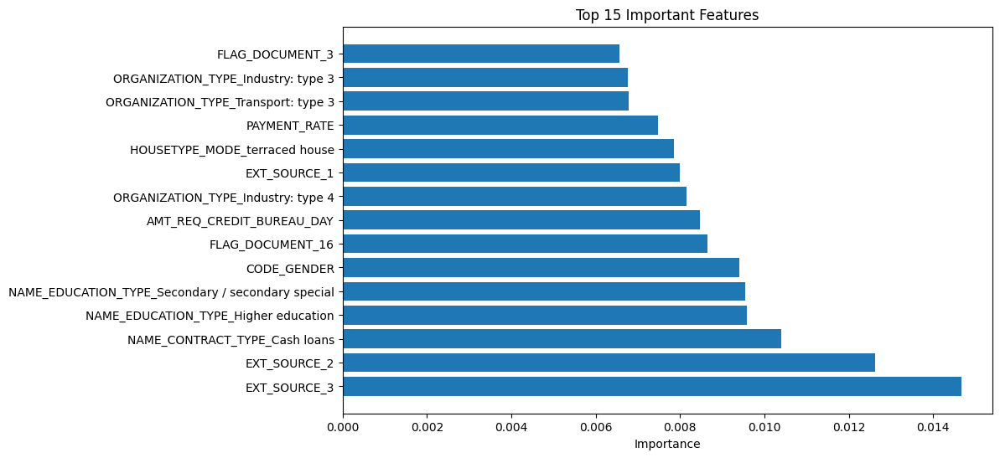

Expected value: -2.5260375


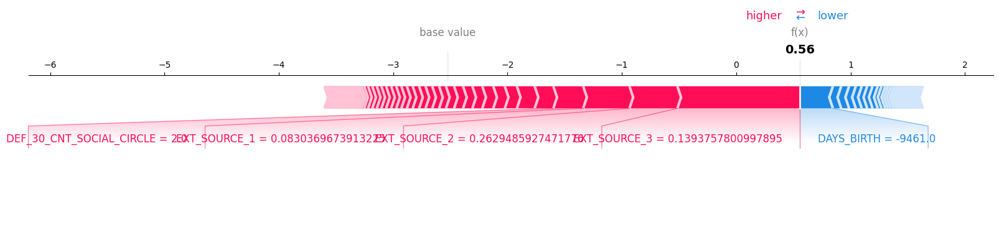

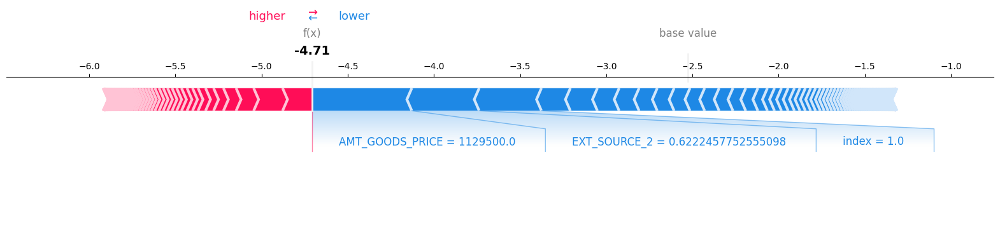

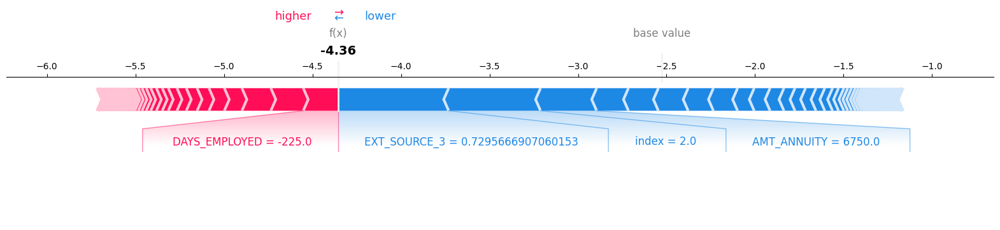

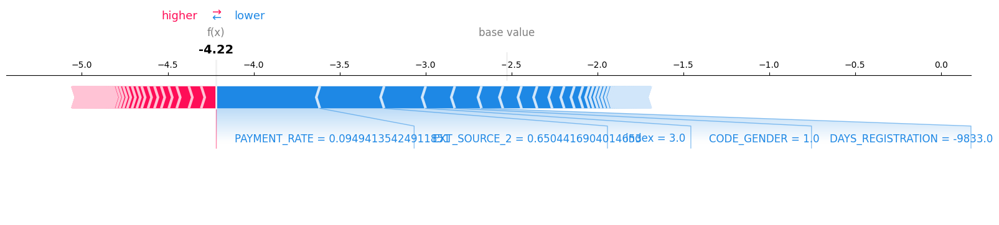

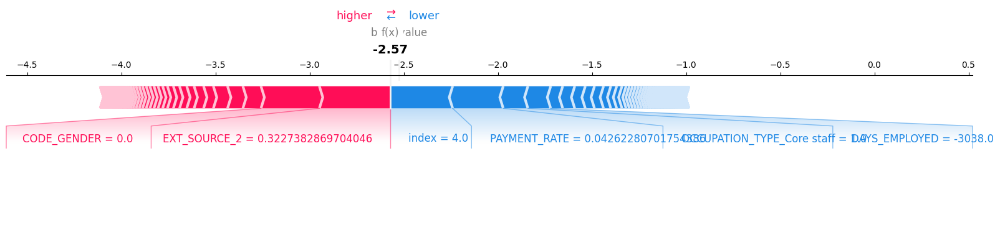

...

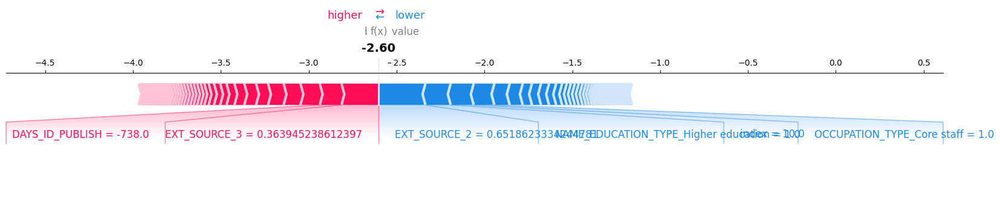

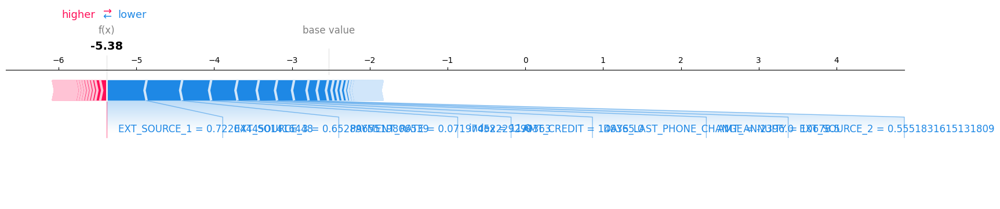

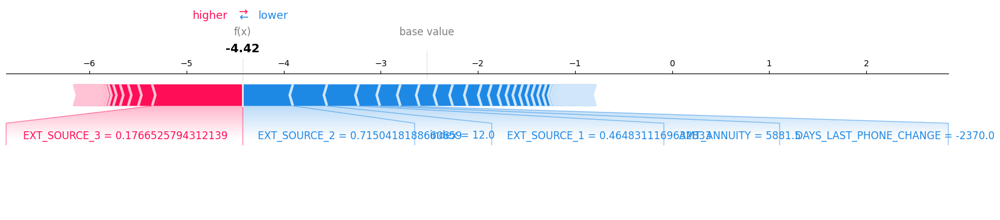

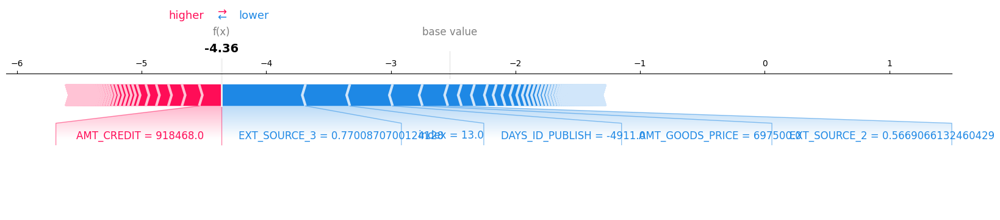

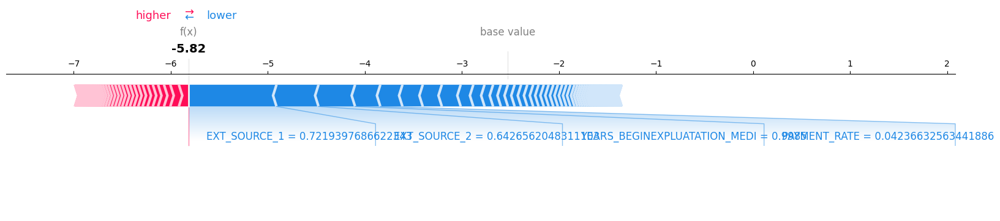

Full model run - done in 653s


In [21]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
import mlflow.lightgbm
from flask import Flask
import shap


warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

# Main function
def main(debug=False):
    num_rows = 10000 if debug else None
        
    # Load the dataset
    df = application_train_test(num_rows)
    df = df.dropna(subset=['TARGET'])

    # Define predictors (feature columns)
    predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
    
    # Define X and y
    X = df[predictors]  # Features (predictors)
    y = df['TARGET']   # Target variable

    # Handle NaN, inf or very large values
    X = X.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
    X = X.fillna(X.mean())  # Fill NaN values with the column mean

    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)  # Apply standard scaling to the features

    # Define the model
    xgb = XGBClassifier(random_state=42)  # Removed use_label_encoder=False

    # Define the parameter distribution for RandomizedSearchCV
    param_dist = {
        'n_estimators': randint(50, 200),
        'max_depth': randint(3, 15),
        'learning_rate': uniform(0.01, 0.2),
        'subsample': uniform(0.8, 0.2),
        'colsample_bytree': uniform(0.8, 0.2),
        'reg_alpha': uniform(0, 0.1),
        'reg_lambda': uniform(1, 5)
    }

    # Set up RandomizedSearchCV with multiple metrics
    random_search = RandomizedSearchCV(
        estimator=xgb,
        param_distributions=param_dist,
        n_iter=50,
        scoring={'roc_auc': 'roc_auc', 'custom_metric': custom_scorer},  # Multi-metric scoring
        refit='custom_metric',  # Use custom metric for the final model selection
        cv=5,
        random_state=42,
        n_jobs=-1
    )

    # Fit the RandomizedSearchCV
    random_search.fit(X_scaled, y)

    # Output best parameters and scores
    print(f"Best Parameters: {random_search.best_params_}")
    print(f"Best Cross-Validated AUC: {random_search.cv_results_['mean_test_roc_auc'][random_search.best_index_]}")
    print(f"Best Cross-Validated Custom Score: {random_search.cv_results_['mean_test_custom_metric'][random_search.best_index_]}")

    # Stratified K-Fold Cross Validation
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    auc_scores = []
    custom_scores = []
    confusion_matrices = []  # List to store TP, FP, TN, FN for each fold

    for train_index, test_index in skf.split(X_scaled, y):
        X_train, X_test = X_scaled[train_index], X_scaled[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Use the best model from RandomizedSearchCV
        best_xgb = random_search.best_estimator_
        best_xgb.fit(X_train, y_train)

        # Predictions
        y_pred_prob = best_xgb.predict_proba(X_test)[:, 1]
        y_pred = best_xgb.predict(X_test)

        # Evaluate AUC
        auc = roc_auc_score(y_test, y_pred_prob)
        auc_scores.append(auc)

        # Evaluate custom metric
        custom_score = custom_metric(y_test, y_pred)
        custom_scores.append(custom_score)

        # Confusion Matrix
        cm = confusion_matrix(y_test, y_pred)
        tn, fp, fn, tp = cm.ravel()

        # Store the confusion matrix values for this fold
        confusion_matrices.append({'TP': tp, 'FP': fp, 'TN': tn, 'FN': fn})

        print(f"Fold AUC: {auc}, Fold Custom Score: {custom_score}")

    # Average AUC score and custom metric across folds
    print(f"Average AUC: {np.mean(auc_scores)}")
    print(f"Average Custom Score: {np.mean(custom_scores)}")

    # Average confusion matrix values across folds
    average_confusion = pd.DataFrame(confusion_matrices).mean().astype(int)
    print("\n### Confusion Matrix Summary ###")
    print(f"True Positive (TP): {average_confusion['TP']} | False Positive (FP): {average_confusion['FP']}")
    print(f"True Negative (TN): {average_confusion['TN']} | False Negative (FN): {average_confusion['FN']}")

    # Calculate the percentage for each category in the confusion matrix
    total = average_confusion.sum()
    percentages = (average_confusion / total) * 100
    print("\n### Confusion Matrix Percentages ###")
    print(percentages)

    # After fitting the model with RandomizedSearchCV
    best_xgb = random_search.best_estimator_
    
    # Get feature importances from the best XGBoost model
    importances = best_xgb.feature_importances_
    
    # Create a DataFrame with the feature names and their importance scores
    features_df = pd.DataFrame({
        'Feature': X.columns,
        'Importance': importances
    })
    
    # Sort the DataFrame by the importance values in descending order
    features_df = features_df.sort_values(by='Importance', ascending=False)
    
    # Display the top 10 features with the highest importance
    print(features_df.head(15))
    
    # Plot the feature importances
    plt.figure(figsize=(10, 6))
    plt.barh(features_df['Feature'][:15], features_df['Importance'][:15])
    plt.xlabel('Importance')
    plt.title('Top 15 Important Features')
    plt.show()

    # SHAP's TreeExplainer to explain the LightGBM model
    explainer = shap.TreeExplainer(best_xgb)

    # Calculate SHAP values for the dataset
    # Initialize SHAP JS for interactive plots
    shap.initjs()

    # shap_values is a list: [class_0_values, class_1_values] for binary classification
    shap_values = explainer.shap_values(X_scaled)
    print("Expected value:", explainer.expected_value)
    
    # Generate a force plot for a specific instance (example: the first row)
    instance_idx = 0  # Index of the row to explain
    shap.force_plot(
        explainer.expected_value,  # Base value
        shap_values[instance_idx],  # SHAP values for the instance
        X.iloc[instance_idx],  # Feature values for the instance
        feature_names=X.columns.tolist()  # Column names for better readability
    )
    
    # Generate force plots for the first 10 rows
    for row_idx in range(15):  # First 15 rows
        shap.force_plot(
            explainer.expected_value,  # Base value
            shap_values[row_idx],  # SHAP values for the row
            X.iloc[row_idx],  # Feature values for the row
            feature_names=X.columns.tolist(),
            matplotlib=True  # Use Matplotlib for rendering
        )
        
if __name__ == "__main__":
    with timer("Full model run"):
        main()

## XGBoost Threshold 0.010

Using a threshold to reduce the number of input variables and see if the performances are similar.

Train samples: 307511, test samples: 48744
Selected features (importance > 0.01): ['EXT_SOURCE_3', 'EXT_SOURCE_2', 'NAME_EDUCATION_TYPE_Higher education', 'CODE_GENDER', 'NAME_EDUCATION_TYPE_Secondary / secondary special', 'FLAG_DOCUMENT_3', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'PAYMENT_RATE', 'REGION_RATING_CLIENT', 'EXT_SOURCE_1', 'NAME_INCOME_TYPE_Working', 'FLAG_EMP_PHONE']
 Final Selected features :         EXT_SOURCE_3  EXT_SOURCE_2  NAME_EDUCATION_TYPE_Higher education  \
0           0.139376      0.262949                                 False   
1           0.510856      0.622246                                  True   
2           0.729567      0.555912                                 False   
3           0.510856      0.650442                                 False   
4           0.510856      0.322738                                 False   
...              ...           ...                                   ...   
307506      0.510856      0.681632                                 

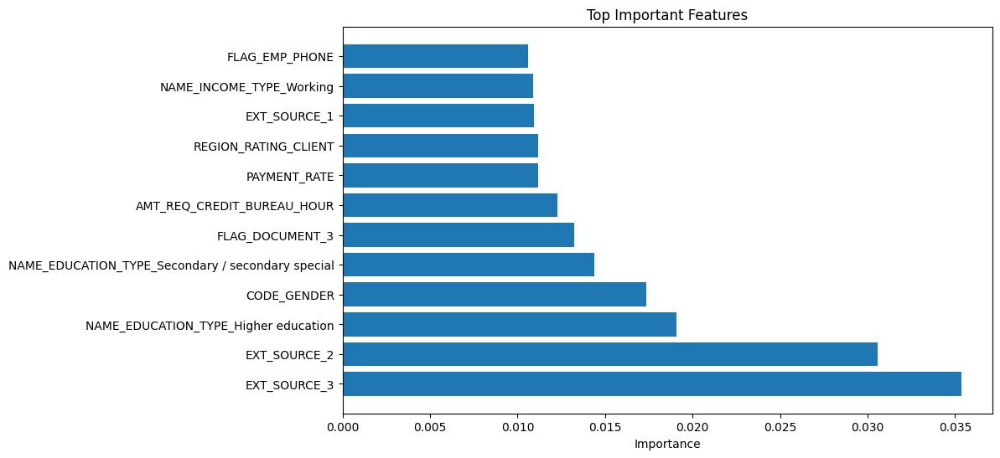

Expected value: -2.5384488


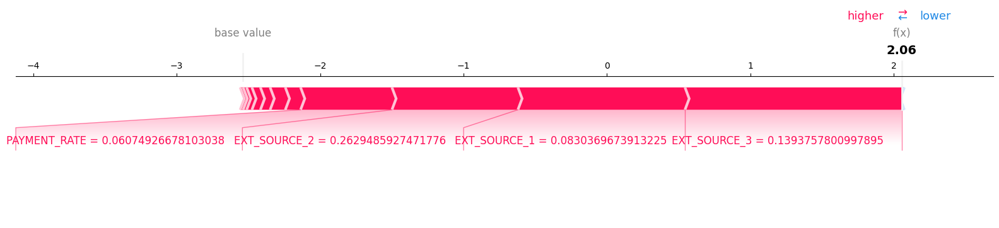

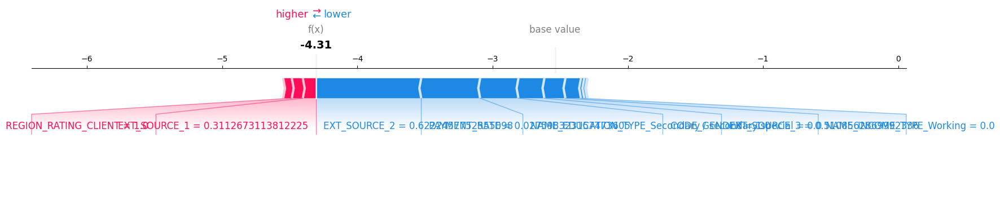

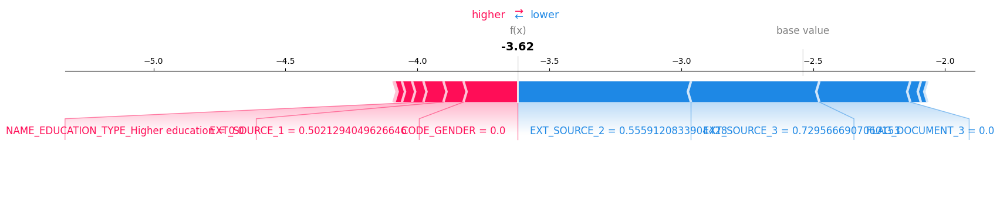

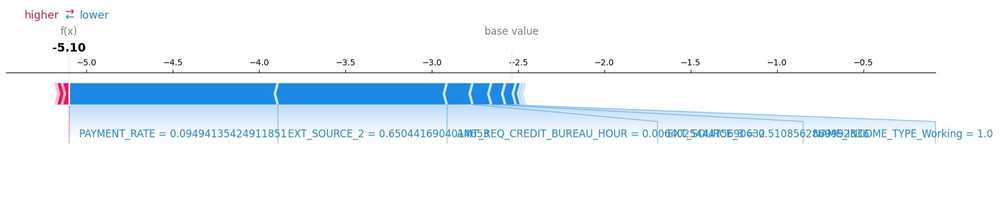

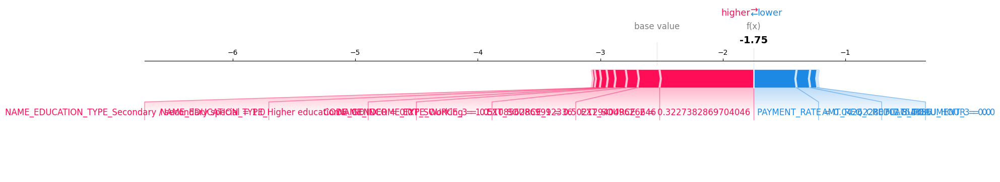

...

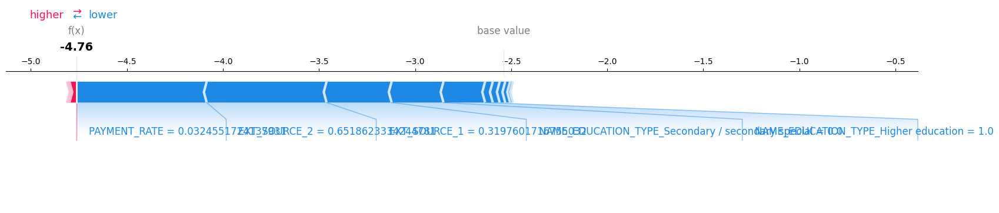

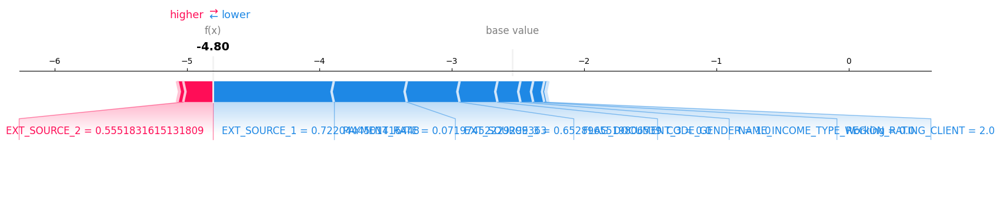

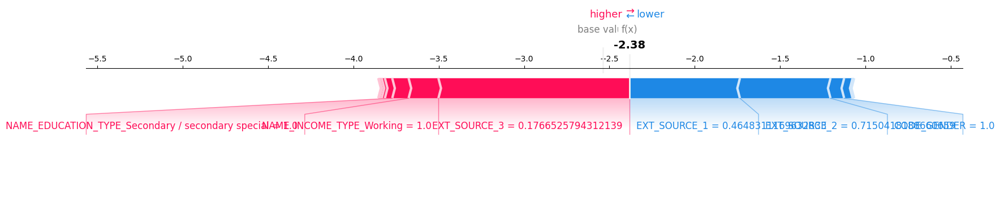

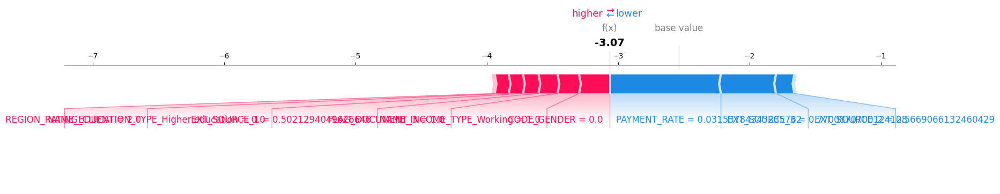

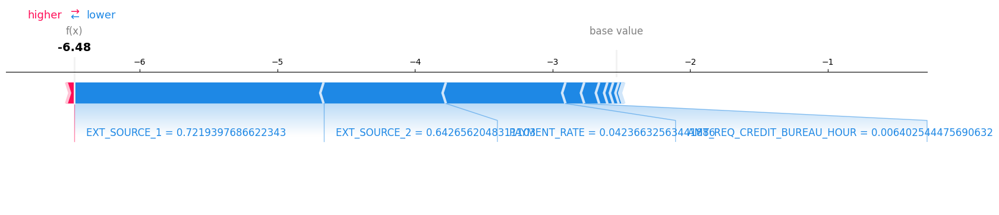

Full model run - done in 399s


In [22]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
import mlflow.lightgbm
from flask import Flask


warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df


# Main function
def main(debug=False):
    num_rows = 10000 if debug else None
        
    # Load the dataset
    df = application_train_test(num_rows)
    
    df = df.dropna(subset=['TARGET'])

    # Define predictors (feature columns)
    predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
    
    # Define X and y
    X = df[predictors]  # Features (predictors)
    y = df['TARGET']   # Target variable

    # Handle NaN, inf or very large values
    X = X.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
    X = X.fillna(X.mean())  # Fill NaN values with the column mean

    # **Feature Importance-Based Selection**
    with timer("Feature selection based on importance threshold"):
        # Train an initial model to get feature importances
        xgb_initial = XGBClassifier(random_state=42)
        xgb_initial.fit(X, y)

        # Get feature importances and sort them
        importances = xgb_initial.feature_importances_
        features_df = pd.DataFrame({
            'Feature': X.columns,
            'Importance': importances
        })
        features_df = features_df.sort_values(by='Importance', ascending=False)

        # Set the threshold for feature importance
        threshold = 0.010  # Threshold
        selected_features = features_df[features_df['Importance'] > threshold]['Feature'].tolist()

        print(f"Selected features (importance > {threshold}): {selected_features}")
        
        # Use only the selected features
        X = X[selected_features]
        print(f" Final Selected features : {X}")

    # Scale selected features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Define the model
    xgb = XGBClassifier(random_state=42)

    # Define the parameter distribution for RandomizedSearchCV
    param_dist = {
        'n_estimators': randint(50, 200),
        'max_depth': randint(3, 15),
        'learning_rate': uniform(0.01, 0.2),
        'subsample': uniform(0.8, 0.2),
        'colsample_bytree': uniform(0.8, 0.2),
        'reg_alpha': uniform(0, 0.1),
        'reg_lambda': uniform(1, 5)
    }

    # Set up RandomizedSearchCV with multiple metrics
    random_search = RandomizedSearchCV(
        estimator=xgb,
        param_distributions=param_dist,
        n_iter=50,
        scoring={'roc_auc': 'roc_auc', 'custom_metric': custom_scorer},
        refit='custom_metric',
        cv=5,
        random_state=42,
        n_jobs=-1
    )

    # Fit the RandomizedSearchCV
    random_search.fit(X_scaled, y)

    # Output best parameters and scores
    print(f"Best Parameters: {random_search.best_params_}")
    print(f"Best Cross-Validated AUC: {random_search.cv_results_['mean_test_roc_auc'][random_search.best_index_]}")
    print(f"Best Cross-Validated Custom Score: {random_search.cv_results_['mean_test_custom_metric'][random_search.best_index_]}")

    # Evaluate the final model
    best_xgb = random_search.best_estimator_
    y_pred = best_xgb.predict(X_scaled)
    
    # Compute the confusion matrix
    cm = confusion_matrix(y, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Calculate the counts and percentages
    total = tn + fp + fn + tp
    metrics_df = pd.DataFrame({
        'Metric': ['True Positives', 'False Positives', 'True Negatives', 'False Negatives'],
        'Count': [tp, fp, tn, fn],
        'Percentage': [tp / total, fp / total, tn / total, fn / total]
    })

    # Display the metrics
    print("Confusion Matrix Metrics:")
    print(metrics_df)
    
    # Filter the features dataframe to include only selected features
    filtered_features_df = features_df[features_df['Feature'].isin(selected_features)]
    
    # Sort by importance again
    filtered_features_df = filtered_features_df.sort_values(by='Importance', ascending=False)
    
    # Plot the top 15 features from the filtered list
    plt.figure(figsize=(10, 6))
    plt.barh(filtered_features_df['Feature'][:15], filtered_features_df['Importance'][:15])
    plt.xlabel('Importance')
    plt.title('Top Important Features')
    plt.show()

    # SHAP's TreeExplainer to explain the LightGBM model
    explainer = shap.TreeExplainer(best_xgb)

    # Calculate SHAP values for the dataset
    # Initialize SHAP JS for interactive plots
    shap.initjs()

    # shap_values is a list: [class_0_values, class_1_values] for binary classification
    shap_values = explainer.shap_values(X_scaled)
    print("Expected value:", explainer.expected_value)
    
    # Generate a force plot for a specific instance (example: the first row)
    instance_idx = 0  # Index of the row to explain
    shap.force_plot(
        explainer.expected_value,  # Base value
        shap_values[instance_idx],  # SHAP values for the instance
        X.iloc[instance_idx],  # Feature values for the instance
        feature_names=X.columns.tolist()  # Column names for better readability
    )
    
    # Generate force plots for the first 10 rows
    for row_idx in range(15):  # First 10 rows
        shap.force_plot(
            explainer.expected_value,  # Base value
            shap_values[row_idx],  # SHAP values for the row
            X.iloc[row_idx],  # Feature values for the row
            feature_names=X.columns.tolist(),
            matplotlib=True 
        )
        
if __name__ == "__main__":
    with timer("Full model run"):
        main()

From the selected features, which ones are in the test dataset  ?

In test dataset : Y/N

'EXT_SOURCE_3' : Y

'EXT_SOURCE_2 : Y

'NAME_EDUCATION_TYPE_Higher education' : Y (encoded)

'CODE_GENDER' : Y

'NAME_EDUCATION_TYPE_Secondary / secondary special' : Y (encoded)

'FLAG_DOCUMENT_3' : Y

'AMT_REQ_CREDIT_BUREAU_HOUR' : Y

'PAYMENT_RATE' : N

'REGION_RATING_CLIENT' : Y

'EXT_SOURCE_1' : Y

'NAME_INCOME_TYPE_Working' : Y (encoded)

'FLAG_EMP_PHONE' : Y

Just use the test dataframe variables as input variables.

## Excluding payment rate to simplify data processing

Train samples: 307511, test samples: 48744
Selected features (importance > 0.01): ['EXT_SOURCE_3', 'EXT_SOURCE_2', 'NAME_EDUCATION_TYPE_Higher education', 'CODE_GENDER', 'NAME_INCOME_TYPE_Working', 'NAME_EDUCATION_TYPE_Secondary / secondary special', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'FLAG_DOCUMENT_3', 'EXT_SOURCE_1']
 Final Selected features :         EXT_SOURCE_3  EXT_SOURCE_2  NAME_EDUCATION_TYPE_Higher education  \
0           0.139376      0.262949                                 False   
1           0.510856      0.622246                                  True   
2           0.729567      0.555912                                 False   
3           0.510856      0.650442                                 False   
4           0.510856      0.322738                                 False   
...              ...           ...                                   ...   
307506      0.510856      0.681632                                 False   
307507      0.510856      0.115992               

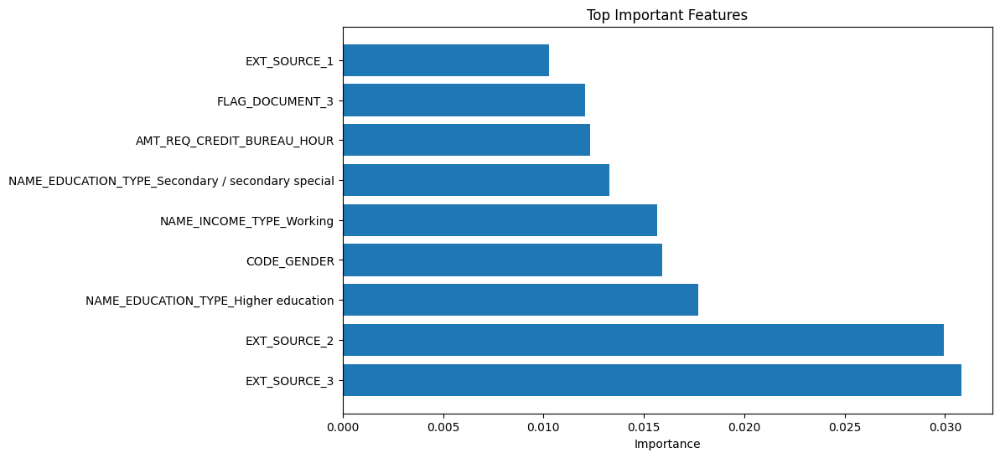

Expected value: -2.5237515


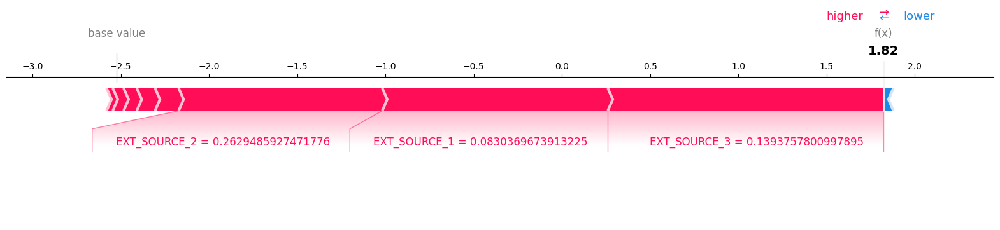

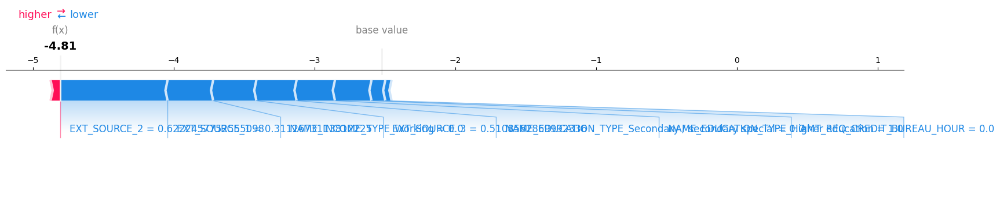

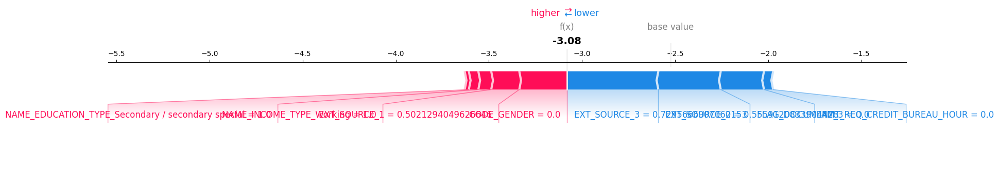

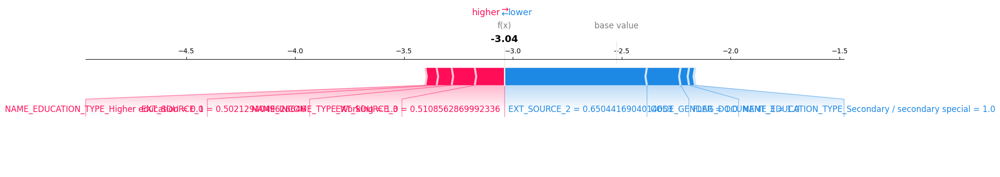

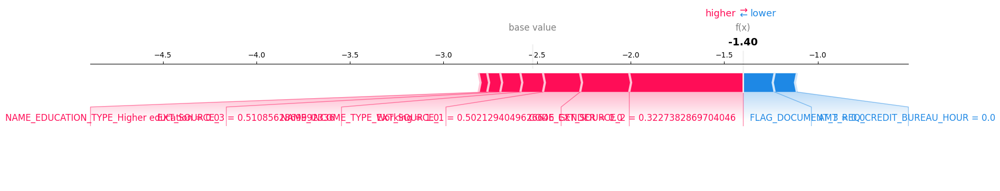

...

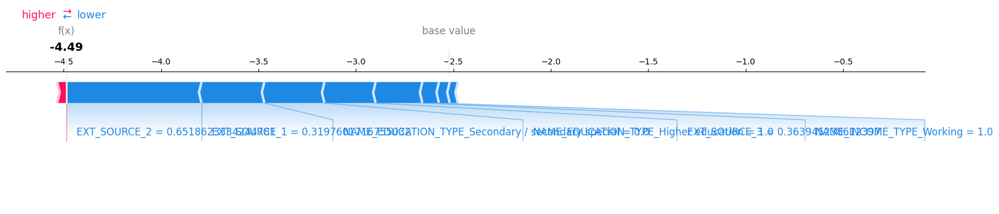

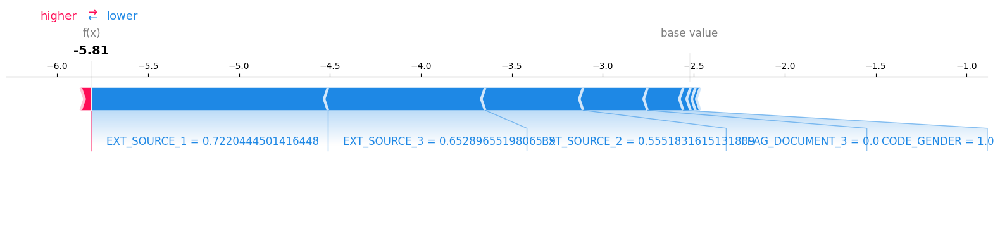

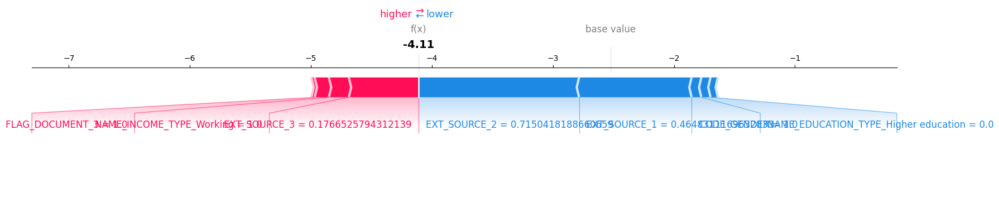

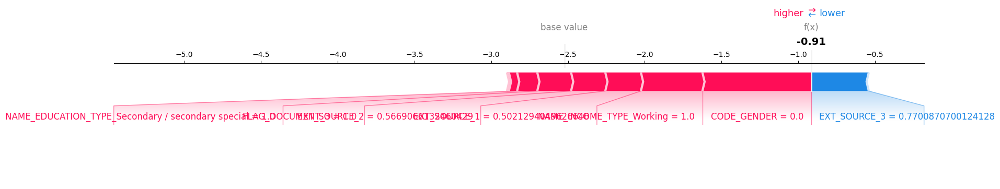

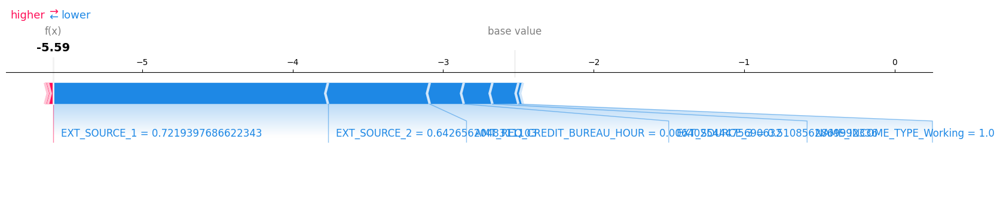

Full model run - done in 405s


In [23]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
import mlflow.lightgbm
from flask import Flask


warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df


# Main function
def main(debug=False):
    num_rows = 10000 if debug else None
        
    # Load the dataset
    df = application_train_test(num_rows)
    
    df = df.dropna(subset=['TARGET'])

    # Define predictors (feature columns), while exluding payment rate
    predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET','PAYMENT_RATE']]
    
    # Define X and y
    X = df[predictors]  # Features (predictors)
    y = df['TARGET']   # Target variable

    # Handle NaN, inf or very large values
    X = X.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
    X = X.fillna(X.mean())  # Fill NaN values with the column mean

    # **Feature Importance-Based Selection**
    with timer("Feature selection based on importance threshold"):
        # Train an initial model to get feature importances
        xgb_initial = XGBClassifier(random_state=42)
        xgb_initial.fit(X, y)

        # Get feature importances and sort them
        importances = xgb_initial.feature_importances_
        features_df = pd.DataFrame({
            'Feature': X.columns,
            'Importance': importances
        })
        features_df = features_df.sort_values(by='Importance', ascending=False)

        # Set the threshold for feature importance
        threshold = 0.010  # Threshold
        selected_features = features_df[features_df['Importance'] > threshold]['Feature'].tolist()

        print(f"Selected features (importance > {threshold}): {selected_features}")
        
        # Use only the selected features
        X = X[selected_features]
        print(f" Final Selected features : {X}")

    # Scale selected features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Define the model
    xgb = XGBClassifier(random_state=42)

    # Define the parameter distribution for RandomizedSearchCV
    param_dist = {
        'n_estimators': randint(50, 200),
        'max_depth': randint(3, 15),
        'learning_rate': uniform(0.01, 0.2),
        'subsample': uniform(0.8, 0.2),
        'colsample_bytree': uniform(0.8, 0.2),
        'reg_alpha': uniform(0, 0.1),
        'reg_lambda': uniform(1, 5)
    }

    # Set up RandomizedSearchCV with multiple metrics
    random_search = RandomizedSearchCV(
        estimator=xgb,
        param_distributions=param_dist,
        n_iter=50,
        scoring={'roc_auc': 'roc_auc', 'custom_metric': custom_scorer},
        refit='custom_metric',
        cv=5,
        random_state=42,
        n_jobs=-1
    )

    # Fit the RandomizedSearchCV
    random_search.fit(X_scaled, y)

    # Output best parameters and scores
    print(f"Best Parameters: {random_search.best_params_}")
    print(f"Best Cross-Validated AUC: {random_search.cv_results_['mean_test_roc_auc'][random_search.best_index_]}")
    print(f"Best Cross-Validated Custom Score: {random_search.cv_results_['mean_test_custom_metric'][random_search.best_index_]}")

    # Evaluate the final model
    best_xgb = random_search.best_estimator_
    y_pred = best_xgb.predict(X_scaled)
    
    # Compute the confusion matrix
    cm = confusion_matrix(y, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Calculate the counts and percentages
    total = tn + fp + fn + tp
    metrics_df = pd.DataFrame({
        'Metric': ['True Positives', 'False Positives', 'True Negatives', 'False Negatives'],
        'Count': [tp, fp, tn, fn],
        'Percentage': [tp / total, fp / total, tn / total, fn / total]
    })

    # Display the metrics
    print("Confusion Matrix Metrics:")
    print(metrics_df)
    
    # Filter the features dataframe to include only selected features
    filtered_features_df = features_df[features_df['Feature'].isin(selected_features)]
    
    # Sort by importance again
    filtered_features_df = filtered_features_df.sort_values(by='Importance', ascending=False)
    
    # Plot the top 15 features from the filtered list
    plt.figure(figsize=(10, 6))
    plt.barh(filtered_features_df['Feature'][:15], filtered_features_df['Importance'][:15])
    plt.xlabel('Importance')
    plt.title('Top Important Features')
    plt.show()

    # SHAP's TreeExplainer to explain the LightGBM model
    explainer = shap.TreeExplainer(best_xgb)

    # Calculate SHAP values for the dataset
    # Initialize SHAP JS for interactive plots
    shap.initjs()

    # shap_values is a list: [class_0_values, class_1_values] for binary classification
    shap_values = explainer.shap_values(X_scaled)
    print("Expected value:", explainer.expected_value)
    
    # Generate a force plot for a specific instance (example: the first row)
    instance_idx = 0  # Index of the row to explain
    shap.force_plot(
        explainer.expected_value,  # Base value
        shap_values[instance_idx],  # SHAP values for the instance
        X.iloc[instance_idx],  # Feature values for the instance
        feature_names=X.columns.tolist()  # Column names for better readability
    )
    
    # Generate force plots for the first 10 rows
    for row_idx in range(15):  # First 10 rows
        shap.force_plot(
            explainer.expected_value,  # Base value
            shap_values[row_idx],  # SHAP values for the row
            X.iloc[row_idx],  # Feature values for the row
            feature_names=X.columns.tolist(),
            matplotlib=True 
        )
        
if __name__ == "__main__":
    with timer("Full model run"):
        main()

## XGBoost Threshold 0.011

Using a threshold to reduce the number of input variables and see if the performances are similar.

Train samples: 307511, test samples: 48744
Selected features (importance > 0.011): ['EXT_SOURCE_3', 'EXT_SOURCE_2', 'NAME_EDUCATION_TYPE_Higher education', 'CODE_GENDER', 'NAME_EDUCATION_TYPE_Secondary / secondary special', 'FLAG_DOCUMENT_3', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'PAYMENT_RATE', 'REGION_RATING_CLIENT']
 Final Selected features :         EXT_SOURCE_3  EXT_SOURCE_2  NAME_EDUCATION_TYPE_Higher education  \
0           0.139376      0.262949                                 False   
1           0.510856      0.622246                                  True   
2           0.729567      0.555912                                 False   
3           0.510856      0.650442                                 False   
4           0.510856      0.322738                                 False   
...              ...           ...                                   ...   
307506      0.510856      0.681632                                 False   
307507      0.510856      0.115992                  

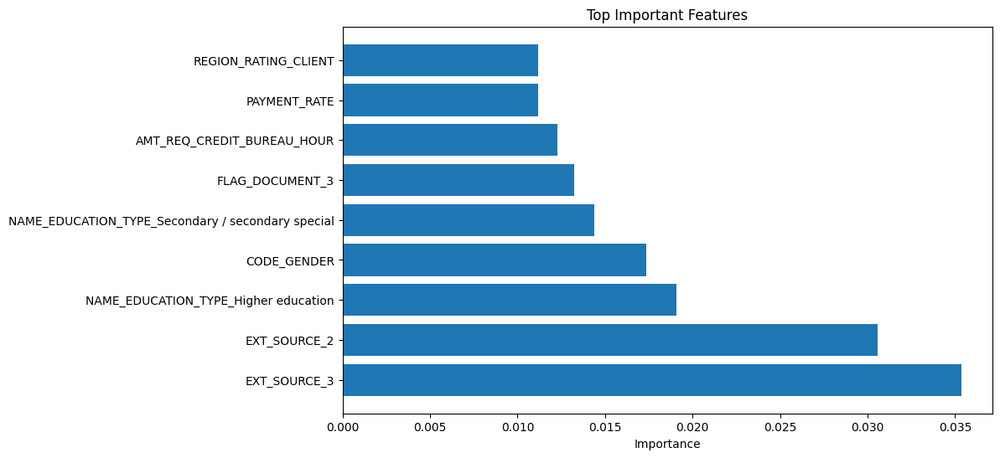

Expected value: -2.5381076


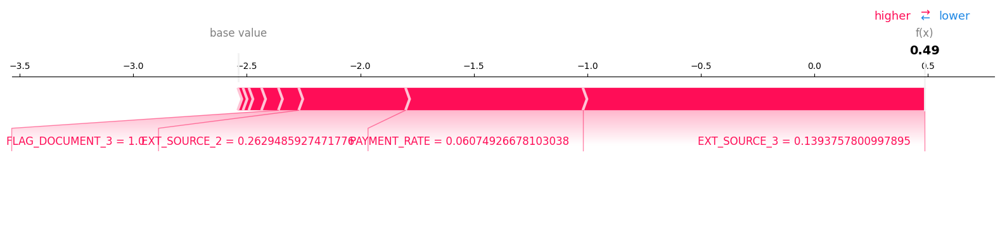

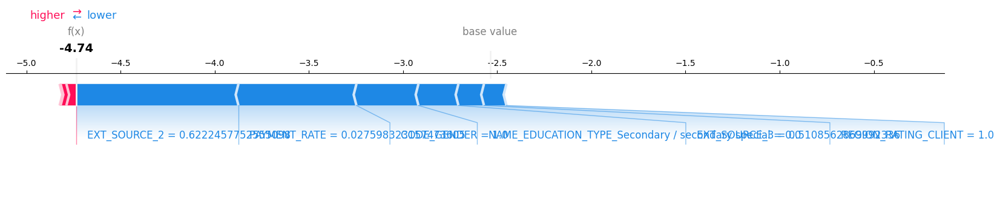

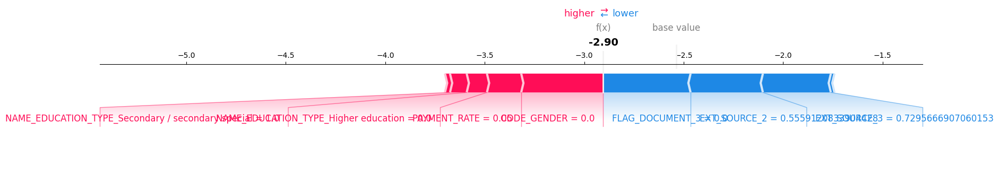

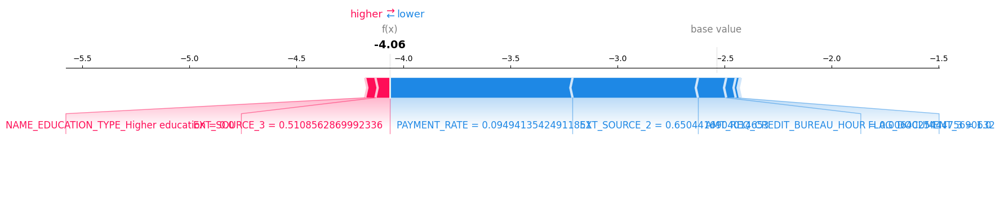

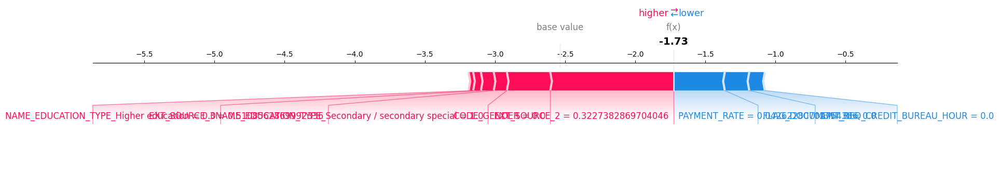

...

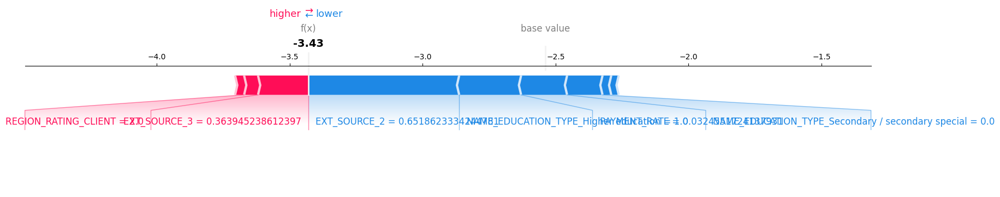

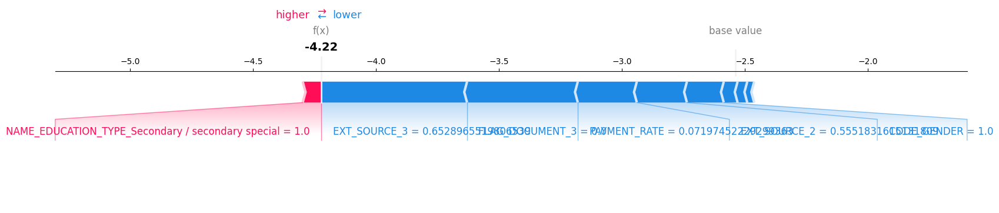

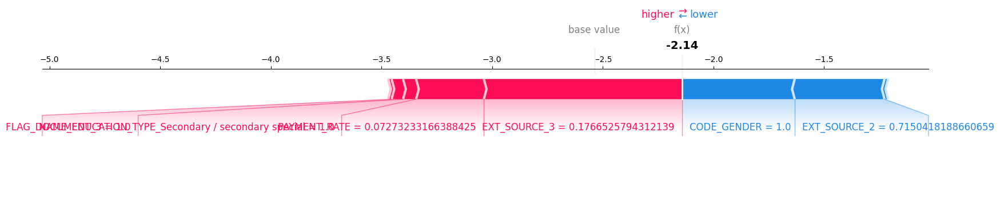

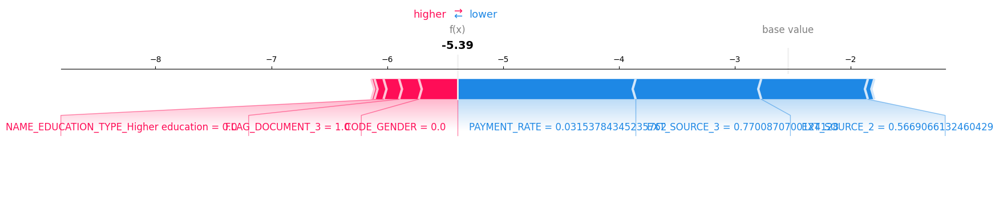

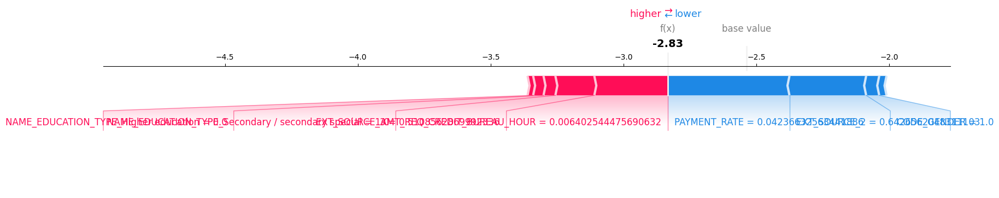

Full model run - done in 414s


In [24]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
import mlflow.lightgbm
from flask import Flask


warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df


# Main function
def main(debug=False):
    num_rows = 10000 if debug else None
        
    # Load the dataset
    df = application_train_test(num_rows)
    
    df = df.dropna(subset=['TARGET'])

    # Define predictors (feature columns)
    predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
    
    # Define X and y
    X = df[predictors]  # Features (predictors)
    y = df['TARGET']   # Target variable

    # Handle NaN, inf or very large values
    X = X.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
    X = X.fillna(X.mean())  # Fill NaN values with the column mean

    # **Feature Importance-Based Selection**
    with timer("Feature selection based on importance threshold"):
        # Train an initial model to get feature importances
        xgb_initial = XGBClassifier(random_state=42)
        xgb_initial.fit(X, y)

        # Get feature importances and sort them
        importances = xgb_initial.feature_importances_
        features_df = pd.DataFrame({
            'Feature': X.columns,
            'Importance': importances
        })
        features_df = features_df.sort_values(by='Importance', ascending=False)

        # Set the threshold for feature importance
        threshold = 0.011  # Threshold
        selected_features = features_df[features_df['Importance'] > threshold]['Feature'].tolist()

        print(f"Selected features (importance > {threshold}): {selected_features}")
        
        # Use only the selected features
        X = X[selected_features]
        print(f" Final Selected features : {X}")

    # Scale selected features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Define the model
    xgb = XGBClassifier(random_state=42)

    # Define the parameter distribution for RandomizedSearchCV
    param_dist = {
        'n_estimators': randint(50, 200),
        'max_depth': randint(3, 15),
        'learning_rate': uniform(0.01, 0.2),
        'subsample': uniform(0.8, 0.2),
        'colsample_bytree': uniform(0.8, 0.2),
        'reg_alpha': uniform(0, 0.1),
        'reg_lambda': uniform(1, 5)
    }

    # Set up RandomizedSearchCV with multiple metrics
    random_search = RandomizedSearchCV(
        estimator=xgb,
        param_distributions=param_dist,
        n_iter=50,
        scoring={'roc_auc': 'roc_auc', 'custom_metric': custom_scorer},
        refit='custom_metric',
        cv=5,
        random_state=42,
        n_jobs=-1
    )

    # Fit the RandomizedSearchCV
    random_search.fit(X_scaled, y)

    # Output best parameters and scores
    print(f"Best Parameters: {random_search.best_params_}")
    print(f"Best Cross-Validated AUC: {random_search.cv_results_['mean_test_roc_auc'][random_search.best_index_]}")
    print(f"Best Cross-Validated Custom Score: {random_search.cv_results_['mean_test_custom_metric'][random_search.best_index_]}")

    # Evaluate the final model
    best_xgb = random_search.best_estimator_
    y_pred = best_xgb.predict(X_scaled)
    
    # Compute the confusion matrix
    cm = confusion_matrix(y, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Calculate the counts and percentages
    total = tn + fp + fn + tp
    metrics_df = pd.DataFrame({
        'Metric': ['True Positives', 'False Positives', 'True Negatives', 'False Negatives'],
        'Count': [tp, fp, tn, fn],
        'Percentage': [tp / total, fp / total, tn / total, fn / total]
    })

    # Display the metrics
    print("Confusion Matrix Metrics:")
    print(metrics_df)
    
    # Filter the features dataframe to include only selected features
    filtered_features_df = features_df[features_df['Feature'].isin(selected_features)]
    
    # Sort by importance again
    filtered_features_df = filtered_features_df.sort_values(by='Importance', ascending=False)
    
    # Plot the top 15 features from the filtered list
    plt.figure(figsize=(10, 6))
    plt.barh(filtered_features_df['Feature'][:15], filtered_features_df['Importance'][:15])
    plt.xlabel('Importance')
    plt.title('Top Important Features')
    plt.show()

    # SHAP's TreeExplainer to explain the LightGBM model
    explainer = shap.TreeExplainer(best_xgb)

    # Calculate SHAP values for the dataset
    # Initialize SHAP JS for interactive plots
    shap.initjs()

    # shap_values is a list: [class_0_values, class_1_values] for binary classification
    shap_values = explainer.shap_values(X_scaled)
    print("Expected value:", explainer.expected_value)
    
    # Generate a force plot for a specific instance (example: the first row)
    instance_idx = 0  # Index of the row to explain
    shap.force_plot(
        explainer.expected_value,  # Base value
        shap_values[instance_idx],  # SHAP values for the instance
        X.iloc[instance_idx],  # Feature values for the instance
        feature_names=X.columns.tolist()  # Column names for better readability
    )
    
    # Generate force plots for the first 10 rows
    for row_idx in range(15):  # First 10 rows
        shap.force_plot(
            explainer.expected_value,  # Base value
            shap_values[row_idx],  # SHAP values for the row
            X.iloc[row_idx],  # Feature values for the row
            feature_names=X.columns.tolist(),
            matplotlib=True 
        )
        
if __name__ == "__main__":
    with timer("Full model run"):
        main()

### ML Flow with threshold

In [25]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
from mlflow import log_metric, log_param, log_artifacts
import mlflow.sklearn
from datetime import datetime


warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# Custom score to penalize FP and FN differently
def custom_metric(y_true, y_pred):
    """
    Custom metric for XGBoost evaluation.

    Scoring rules:
    - True Positives (TP) and True Negatives (TN) contribute positively to the score.
    - False Positives (FP) reduce the score (mislabeled good clients).
    - False Negatives (FN) reduce the score more severely (mislabeled bad clients).

    Args:
        y_true (array-like): True labels (0 or 1).
        y_pred (array-like): Predicted probabilities or labels.

    Returns:
        score (float): Custom score.
    """
    # Handle classification probabilities (multi-class or binary) or labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Multi-class classification
    else:
        y_pred = np.round(y_pred).astype(int)  # Binary classification

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Assign weights to each outcome
    weight_tp = 1  # Reward for True Positives
    weight_tn = 1  # Reward for True Negatives
    weight_fp = -1  # Penalty for False Positives
    weight_fn = -10  # Penalty for False Negatives (more severe)

    # Calculate the custom score
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)

    return score

# Define a custom scorer for GridSearchCV or other sklearn tools
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df])
    df = df.reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df


# Main function
def main(debug=False):
    # Define the number of rows for debugging or full dataset
    num_rows = 10000 if debug else None

    # Configure MLflow to use a local directory
    local_tracking_dir = "/home/XGB_vast_mlflow_results"
    os.makedirs(local_tracking_dir, exist_ok=True)
    mlruns_dir = os.path.join(local_tracking_dir, ".mlruns")
    os.makedirs(mlruns_dir, exist_ok=True)
    mlflow.set_tracking_uri(f"file://{mlruns_dir}")

    # Start the MLflow run
    experiment_name = "XGB Test with threshold"
    mlflow.set_experiment(experiment_name)  # Set the MLflow experiment
    
    # Unique name for each run based on timestamp or model type
    run_name = f"XGB_Run_Thresh_0.004_{datetime.now().strftime('%Y%m%d_%H%M%S')}"
    
    try:
        with mlflow.start_run(run_name=run_name):
            # Log parameters and metadata
            mlflow.log_param("debug_mode", debug)
            mlflow.log_param("num_rows", num_rows)
            
            # Load the dataset
            df = application_train_test(num_rows)
            
            df = df.dropna(subset=['TARGET'])

            # Define predictors (feature columns), excluding payment_rate
            predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET','PAYMENT_RATE']]
            
            # Define X and y
            X = df[predictors]
            y = df['TARGET']
        
            X = X.replace([np.inf, -np.inf], np.nan)
            X = X.fillna(X.mean())
    
            # Feature selection
            with timer("Feature selection based on importance threshold"):
                xgb_initial = XGBClassifier(random_state=42)
                xgb_initial.fit(X, y)
    
                importances = xgb_initial.feature_importances_
                features_df = pd.DataFrame({
                    'Feature': X.columns,
                    'Importance': importances
                })
                threshold = 0.010  # Importance threshold
                selected_features = features_df[features_df['Importance'] > threshold]['Feature'].tolist()
    
                # Log the number of selected features
                mlflow.log_param("selected_features_count", len(selected_features))
    
                # Continue with selected features
                X = X[selected_features]
    
            # Scale selected features
            scaler = StandardScaler()
            X_scaled = scaler.fit_transform(X)
    
            # Hyperparameter tuning with RandomizedSearchCV
            xgb = XGBClassifier(random_state=42)
            param_dist = {
                'n_estimators': randint(50, 200),
                'max_depth': randint(3, 15),
                'learning_rate': uniform(0.01, 0.2),
                'subsample': uniform(0.8, 0.2),
                'colsample_bytree': uniform(0.8, 0.2),
                'reg_alpha': uniform(0, 0.1),
                'reg_lambda': uniform(1, 5)
            }
    
            random_search = RandomizedSearchCV(
                estimator=xgb,
                param_distributions=param_dist,
                n_iter=50,
                scoring={'roc_auc': 'roc_auc', 'custom_metric': custom_scorer},
                refit='custom_metric',
                cv=5,
                random_state=42,
                n_jobs=-1
            )
    
            random_search.fit(X_scaled, y)
    
            # Stratified K-Fold Cross Validation with best estimator
            skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
            
            auc_scores = []
            custom_scores = []
            
            for fold_idx, (train_index, test_index) in enumerate(skf.split(X_scaled, y), 1):
                X_train, X_test = X_scaled[train_index], X_scaled[test_index]
                y_train, y_test = y.iloc[train_index], y.iloc[test_index]
            
                best_xgb = random_search.best_estimator_
                best_xgb.fit(X_train, y_train)
            
                y_pred_prob = best_xgb.predict_proba(X_test)[:, 1]
                y_pred = best_xgb.predict(X_test)
            
                # Compute AUC
                auc = roc_auc_score(y_test, y_pred_prob)
                auc_scores.append(auc)
            
                # Compute custom metric
                custom_score = custom_metric(y_test, y_pred)
                custom_scores.append(custom_score)
            
            # Compute average scores
            avg_auc_score = np.mean(auc_scores)
            avg_custom_score = np.mean(custom_scores)
            
            # Log the hyperparameters (same as before)
            best_custom_params = random_search.cv_results_['params'][random_search.best_index_]
            mlflow.log_params({f"custom_{key}": value for key, value in best_custom_params.items()})
            
            best_auc_index = np.argmax(random_search.cv_results_['mean_test_roc_auc'])
            best_auc_params = random_search.cv_results_['params'][best_auc_index]
            mlflow.log_params({f"auc_{key}": value for key, value in best_auc_params.items()})
            
            # Log the average scores instead of the best scores
            mlflow.log_metrics({
                "avg_custom_score": avg_custom_score,
                "avg_auc_score": avg_auc_score
            })
            
            # Evaluate the final model
            best_xgb = random_search.best_estimator_
            y_pred = best_xgb.predict(X_scaled)
    
            # Log the model with the best custom metric
            best_model = random_search.best_estimator_
            mlflow.sklearn.log_model(best_model, artifact_path="model")
            
            print("Hyperparameters and metrics have been logged to MLflow.")
            
            # Save the model to the MLflow model registry
            mlflow.sklearn.log_model(
                sk_model=best_model,  # Use the best model identified earlier
                artifact_path="xgb_test_model",  # Path in MLflow where the model will be saved
                registered_model_name="XGB_Test_Final_Model_Thresh"  # Name of the model in the registry
            )
    
            # Add any additional metrics or artifacts to MLflow
            print(f"Run '{run_name}' logged to MLflow!")
            
    except Exception as e:
        mlflow.log_param("error", str(e))
        raise

if __name__ == "__main__":
    with timer("Full model run"):
        main()

2025/02/09 19:06:26 INFO mlflow.tracking.fluent: Experiment with name 'XGB Test with threshold' does not exist. Creating a new experiment.


Train samples: 307511, test samples: 48744
Feature selection based on importance threshold - done in 3s


2025/02/09 19:07:42 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Hyperparameters and metrics have been logged to MLflow.


2025/02/09 19:07:46 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Run 'XGB_Run_Thresh_0.004_20250209_190626' logged to MLflow!
Full model run - done in 79s


Successfully registered model 'XGB_Test_Final_Model_Thresh'.
Created version '1' of model 'XGB_Test_Final_Model_Thresh'.


### Threshold optimization based on custom score

Train samples: 307511, test samples: 48744
Selected features (importance > 0.011): ['EXT_SOURCE_3', 'EXT_SOURCE_2', 'NAME_EDUCATION_TYPE_Higher education', 'NAME_INCOME_TYPE_Working', 'NAME_EDUCATION_TYPE_Secondary / secondary special', 'CODE_GENDER', 'NAME_CONTRACT_TYPE_Cash loans', 'REGION_RATING_CLIENT', 'FLAG_DOCUMENT_3']
Final Selected features:
   EXT_SOURCE_3  EXT_SOURCE_2  NAME_EDUCATION_TYPE_Higher education  \
0      0.139376      0.262949                                 False   
1      0.510856      0.622246                                  True   
2      0.729567      0.555912                                 False   
3      0.510856      0.650442                                 False   
4      0.510856      0.322738                                 False   

   NAME_INCOME_TYPE_Working  \
0                      True   
1                     False   
2                      True   
3                      True   
4                      True   

   NAME_EDUCATION_TYPE_Secondary 

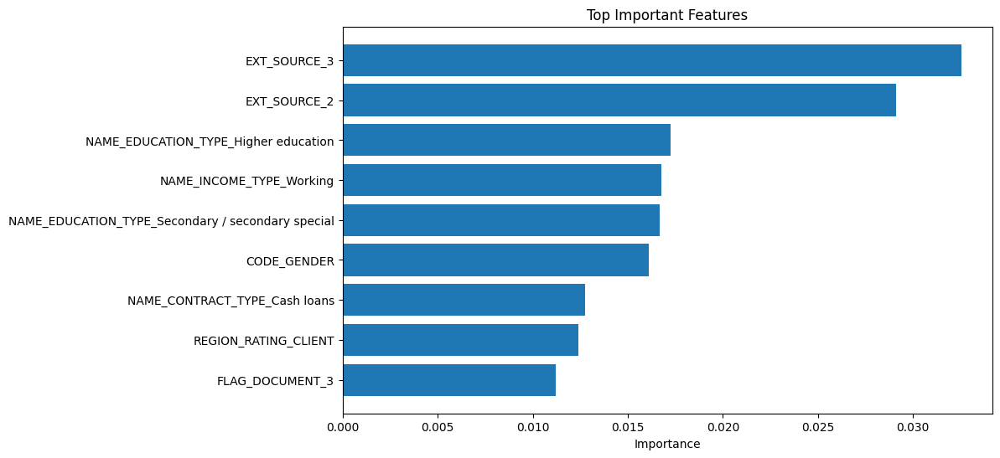

Expected value: -2.5237515


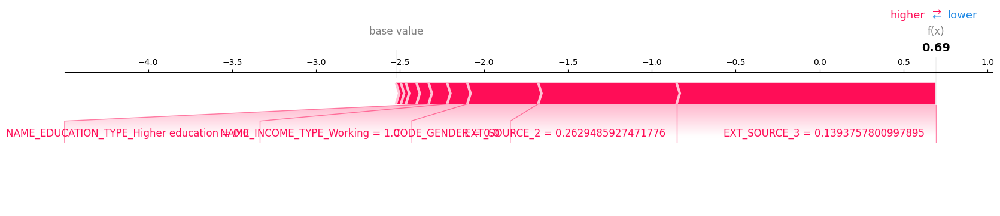

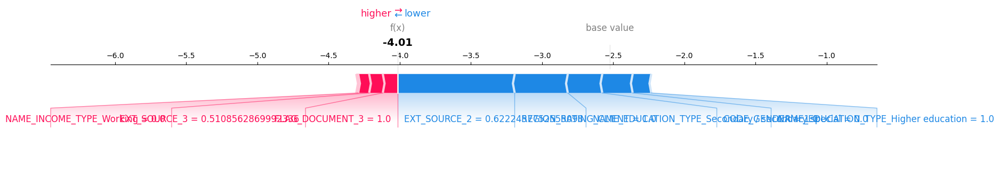

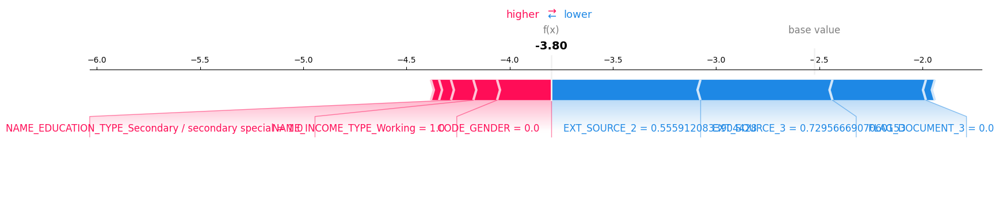

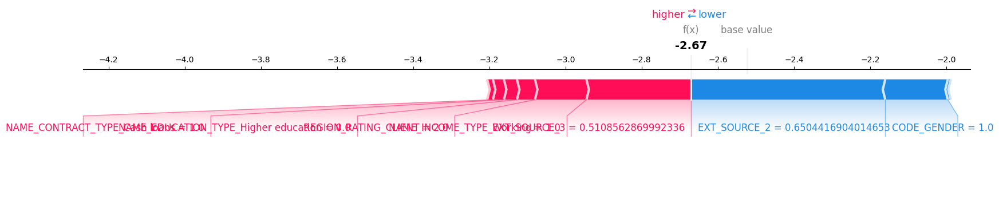

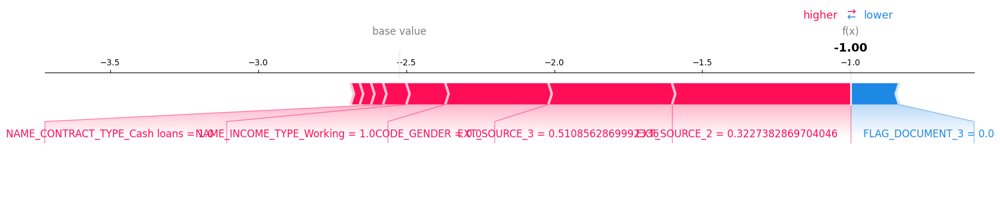

...

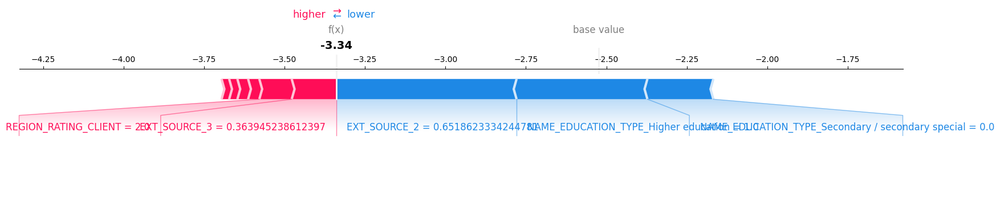

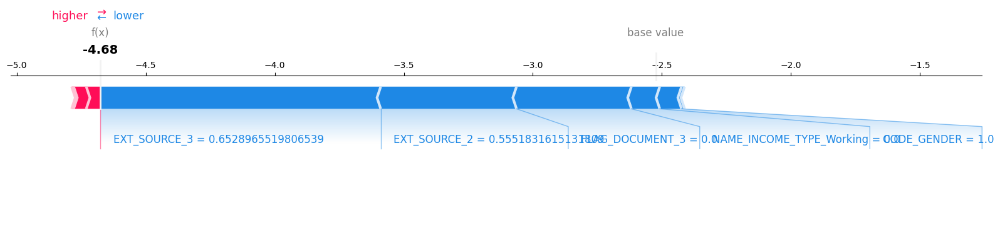

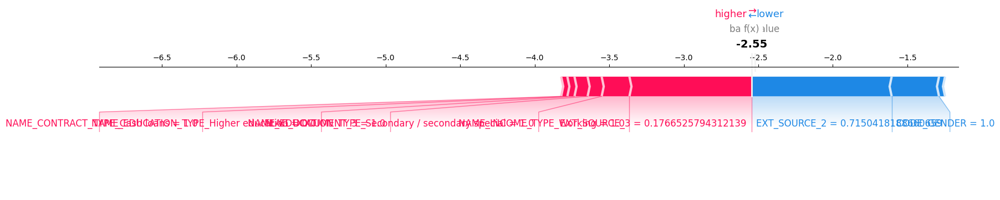

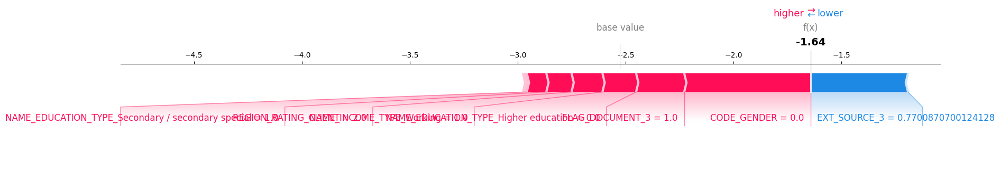

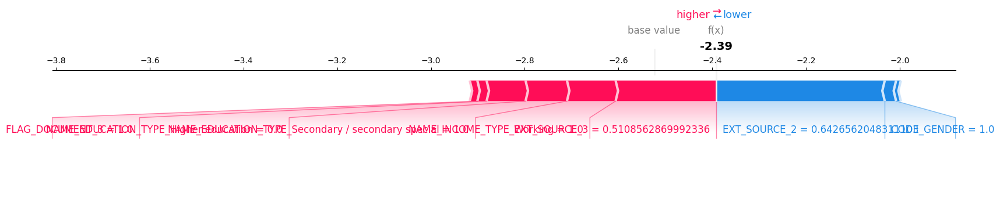

Full model run - done in 400s


In [26]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
import mlflow.lightgbm
from flask import Flask
import shap  # Pour l'explication du modèle avec SHAP

warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# --- Définition de la fonction de scoring custom ---
def custom_metric(y_true, y_pred):
    """
    Score personnalisé pour évaluer le coût métier.

    Règles de scoring :
    - Les vrais positifs (TP) et vrais négatifs (TN) sont récompensés.
    - Les faux positifs (FP) pénalisent (bon client prédit mauvais).
    - Les faux négatifs (FN) pénalisent plus sévèrement (mauvais client prédit bon).

    Ici, nous supposons par exemple que le coût d'un FN est dix fois supérieur à celui d'un FP.

    Args:
        y_true (array-like): Véritables labels (0 ou 1).
        y_pred (array-like): Prédictions (labels binaires).

    Returns:
        score (float): Score calculé.
    """
    # Si y_pred contient des probabilités ou des vecteurs (multi-classe), on transforme en labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Classification multi-classes
    else:
        y_pred = np.round(y_pred).astype(int)  # Classification binaire

    # Calcul de la matrice de confusion
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Poids attribués à chaque issue
    weight_tp = 1    # Récompense pour TP
    weight_tn = 1    # Récompense pour TN
    weight_fp = -1   # Pénalité pour FP
    weight_fn = -10  # Pénalité pour FN (coût dix fois supérieur)

    # Calcul du score personnalisé
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)
    return score

# Création d'un scorer compatible avec scikit-learn
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# --- Fonction d'encodage One-Hot pour les variables catégorielles ---
def one_hot_encoder(df, nan_as_category=True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns=categorical_columns, dummy_na=nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# --- Prétraitement des jeux de données ---
def application_train_test(num_rows=None, nan_as_category=False):
    # Lecture des données train et test
    df = pd.read_csv('application_train.csv', nrows=num_rows)
    test_df = pd.read_csv('application_test.csv', nrows=num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df, test_df])
    df = df.reset_index(drop=True)
    
    # Suppression des enregistrements indésirables
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Encodage binaire pour certaines features
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], _ = pd.factorize(df[bin_feature])
        
    # One-Hot encoding pour les autres features catégorielles
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # Remplacement de la valeur particulière pour DAYS_EMPLOYED par NaN
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace=True)
    
    # Création de nouvelles features simples
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    
    del test_df
    gc.collect()
    return df

# --- Optimisation du seuil de classification ---
def optimize_threshold(model, X, y, thresholds=np.linspace(0, 1, 101)):
    """
    Optimise le seuil de classification afin de maximiser le score métier personnalisé.

    Args:
        model: Modèle entraîné possédant la méthode predict_proba.
        X (array-like): Données sur lesquelles prédire.
        y (array-like): Véritables labels.
        thresholds (array-like): Liste de seuils à tester (par défaut de 0 à 1 par pas de 0.01).

    Returns:
        best_threshold (float): Le seuil optimal.
        best_score (float): Le score métier associé au seuil optimal.
    """
    y_proba = model.predict_proba(X)[:, 1]  # Probabilité pour la classe positive
    best_threshold = 0.5
    best_score = -np.inf
    for t in thresholds:
        y_pred = (y_proba >= t).astype(int)
        score = custom_metric(y, y_pred)
        if score > best_score:
            best_score = score
            best_threshold = t
    return best_threshold, best_score

# --- Fonction principale ---
def main(debug=False):
    num_rows = 10000 if debug else None
        
    # Chargement et prétraitement des données
    df = application_train_test(num_rows)
    
    # On ne garde que les enregistrements avec une TARGET renseignée
    df = df.dropna(subset=['TARGET'])

    # Définition des features prédictives
    predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
    
    # Séparation des features (X) et de la target (y)
    X = df[predictors]
    y = df['TARGET']

    # Gestion des valeurs manquantes et infinies
    X = X.replace([np.inf, -np.inf], np.nan)
    X = X.fillna(X.mean())

    # --- Sélection des features basée sur l'importance ---
    with timer("Feature selection based on importance threshold"):
        # Entraînement d'un modèle initial pour obtenir les importances
        xgb_initial = XGBClassifier(random_state=42)
        xgb_initial.fit(X, y)

        # Récupération et tri des importances
        importances = xgb_initial.feature_importances_
        features_df = pd.DataFrame({
            'Feature': X.columns,
            'Importance': importances
        })
        features_df = features_df.sort_values(by='Importance', ascending=False)

        # Seuil d'importance (modifiable en fonction de votre analyse)
        threshold = 0.011  
        selected_features = features_df[features_df['Importance'] > threshold]['Feature'].tolist()

        print(f"Selected features (importance > {threshold}): {selected_features}")
        
        # On ne garde que les features sélectionnées
        X = X[selected_features]
        print("Final Selected features:")
        print(X.head())

    # Mise à l'échelle des features sélectionnées
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # --- Définition et tuning du modèle ---
    xgb = XGBClassifier(random_state=42)

    # Recherche aléatoire des hyperparamètres
    param_dist = {
        'n_estimators': randint(50, 200),
        'max_depth': randint(3, 15),
        'learning_rate': uniform(0.01, 0.2),
        'subsample': uniform(0.8, 0.2),
        'colsample_bytree': uniform(0.8, 0.2),
        'reg_alpha': uniform(0, 0.1),
        'reg_lambda': uniform(1, 5)
    }

    random_search = RandomizedSearchCV(
        estimator=xgb,
        param_distributions=param_dist,
        n_iter=50,
        scoring={'roc_auc': 'roc_auc', 'custom_metric': custom_scorer},
        refit='custom_metric',
        cv=5,
        random_state=42,
        n_jobs=-1
    )

    # Entraînement avec RandomizedSearchCV
    random_search.fit(X_scaled, y)

    # Affichage des meilleurs paramètres et scores
    print(f"Best Parameters: {random_search.best_params_}")
    print(f"Best Cross-Validated AUC: {random_search.cv_results_['mean_test_roc_auc'][random_search.best_index_]}")
    print(f"Best Cross-Validated Custom Score: {random_search.cv_results_['mean_test_custom_metric'][random_search.best_index_]}")

    # Récupération du meilleur modèle
    best_xgb = random_search.best_estimator_

    # --- Optimisation du seuil de classification ---
    best_threshold, best_custom_score = optimize_threshold(best_xgb, X_scaled, y)
    print(f"Meilleur seuil optimisé: {best_threshold:.2f} avec un score personnalisé de {best_custom_score}")

    # Prédictions à partir du seuil optimisé
    y_pred_optimized = (best_xgb.predict_proba(X_scaled)[:, 1] >= best_threshold).astype(int)

    # Affichage de la matrice de confusion avec le seuil optimisé
    cm_optimized = confusion_matrix(y, y_pred_optimized)
    tn, fp, fn, tp = cm_optimized.ravel()
    print("Matrice de confusion avec seuil optimisé:")
    print(cm_optimized)
    
    # --- Visualisation de l'importance des features ---
    filtered_features_df = features_df[features_df['Feature'].isin(selected_features)]
    filtered_features_df = filtered_features_df.sort_values(by='Importance', ascending=False)
    
    plt.figure(figsize=(10, 6))
    plt.barh(filtered_features_df['Feature'][:15], filtered_features_df['Importance'][:15])
    plt.xlabel('Importance')
    plt.title('Top Important Features')
    plt.gca().invert_yaxis()
    plt.show()

    # --- Explication du modèle avec SHAP ---
    explainer = shap.TreeExplainer(best_xgb)
    shap.initjs()
    
    # Calcul des valeurs SHAP sur l'ensemble des données
    shap_values = explainer.shap_values(X_scaled)
    print("Expected value:", explainer.expected_value)

    # Exemple de force plot pour le premier échantillon
    instance_idx = 0
    shap.force_plot(
        explainer.expected_value,   # Valeur de base
        shap_values[instance_idx],  # Valeurs SHAP pour l'échantillon
        X.iloc[instance_idx],       # Valeurs des features pour l'échantillon
        feature_names=X.columns.tolist()
    )
    
    # Force plots pour les 15 premiers enregistrements
    for row_idx in range(15):
        shap.force_plot(
            explainer.expected_value,
            shap_values[row_idx],
            X.iloc[row_idx],
            feature_names=X.columns.tolist(),
            matplotlib=True 
        )

if __name__ == "__main__":
    with timer("Full model run"):
        main()

### ML Flow Thresh Opt

In [27]:
import pandas as pd
import gc
import numpy as np
import time
from contextlib import contextmanager
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score, classification_report, roc_curve
from scipy.stats import uniform, randint
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
import os
import mlflow
from mlflow import log_metric, log_param, log_artifacts
import mlflow.sklearn
from datetime import datetime
from flask import Flask
import shap  # Pour l'explication du modèle avec SHAP

warnings.simplefilter(action='ignore', category=FutureWarning)

# Timer for benchmarking
@contextmanager
def timer(title):
    start = time.time()
    yield
    print(f"{title} - done in {time.time() - start:.0f}s")

# --- Définition de la fonction de scoring custom ---
def custom_metric(y_true, y_pred):
    """
    Score personnalisé pour évaluer le coût métier.

    Règles de scoring :
    - Les vrais positifs (TP) et vrais négatifs (TN) sont récompensés.
    - Les faux positifs (FP) pénalisent (bon client prédit mauvais).
    - Les faux négatifs (FN) pénalisent plus sévèrement (mauvais client prédit bon).

    Ici, nous supposons par exemple que le coût d'un FN est dix fois supérieur à celui d'un FP.

    Args:
        y_true (array-like): Véritables labels (0 ou 1).
        y_pred (array-like): Prédictions (labels binaires).

    Returns:
        score (float): Score calculé.
    """
    # Si y_pred contient des probabilités ou des vecteurs (multi-classe), on transforme en labels
    if y_pred.ndim > 1 and y_pred.shape[1] > 1:
        y_pred = np.argmax(y_pred, axis=1)  # Classification multi-classes
    else:
        y_pred = np.round(y_pred).astype(int)  # Classification binaire

    # Calcul de la matrice de confusion
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    # Poids attribués à chaque issue
    weight_tp = 1    # Récompense pour TP
    weight_tn = 1    # Récompense pour TN
    weight_fp = -1   # Pénalité pour FP
    weight_fn = -10  # Pénalité pour FN (coût dix fois supérieur)

    # Calcul du score personnalisé
    score = (weight_tp * tp) + (weight_tn * tn) + (weight_fp * fp) + (weight_fn * fn)
    return score

# Création d'un scorer compatible avec scikit-learn
custom_scorer = make_scorer(custom_metric, greater_is_better=True)

# --- Fonction d'encodage One-Hot pour les variables catégorielles ---
def one_hot_encoder(df, nan_as_category=True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns=categorical_columns, dummy_na=nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# --- Prétraitement des jeux de données ---
def application_train_test(num_rows=None, nan_as_category=False):
    # Lecture des données train et test
    df = pd.read_csv('application_train.csv', nrows=num_rows)
    test_df = pd.read_csv('application_test.csv', nrows=num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = pd.concat([df, test_df])
    df = df.reset_index(drop=True)
    
    # Suppression des enregistrements indésirables
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Encodage binaire pour certaines features
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], _ = pd.factorize(df[bin_feature])
        
    # One-Hot encoding pour les autres features catégorielles
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # Remplacement de la valeur particulière pour DAYS_EMPLOYED par NaN
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace=True)
    
    # Création de nouvelles features simples
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    
    del test_df
    gc.collect()
    return df

# --- Optimisation du seuil de classification ---
def optimize_threshold(model, X, y, thresholds=np.linspace(0, 1, 101)):
    """
    Optimise le seuil de classification afin de maximiser le score métier personnalisé.

    Args:
        model: Modèle entraîné possédant la méthode predict_proba.
        X (array-like): Données sur lesquelles prédire.
        y (array-like): Véritables labels.
        thresholds (array-like): Liste de seuils à tester (par défaut de 0 à 1 par pas de 0.01).

    Returns:
        best_threshold (float): Le seuil optimal.
        best_score (float): Le score métier associé au seuil optimal.
    """
    y_proba = model.predict_proba(X)[:, 1]  # Probabilité pour la classe positive
    best_threshold = 0.5
    best_score = -np.inf
    for t in thresholds:
        y_pred = (y_proba >= t).astype(int)
        score = custom_metric(y, y_pred)
        if score > best_score:
            best_score = score
            best_threshold = t
    return best_threshold, best_score

# --- Fonction principale ---
def main(debug=False):
    num_rows = 10000 if debug else None

    # Configure MLflow to use a local directory
    local_tracking_dir = "/home/XGB_vast_mlflow_results"
    os.makedirs(local_tracking_dir, exist_ok=True)
    mlruns_dir = os.path.join(local_tracking_dir, ".mlruns")
    os.makedirs(mlruns_dir, exist_ok=True)
    mlflow.set_tracking_uri(f"file://{mlruns_dir}")

    # Start the MLflow run
    experiment_name = "XGB OptThresh Model"
    mlflow.set_experiment(experiment_name)  # Set the MLflow experiment
    
    # Unique name for each run based on timestamp or model type
    run_name = f"XGB_Run_Thresh_0.004_{datetime.now().strftime('%Y%m%d_%H%M%S')}"

    try:
        with mlflow.start_run(run_name=run_name):
            # Log parameters and metadata
            mlflow.log_param("debug_mode", debug)
            mlflow.log_param("num_rows", num_rows)
        
            # Chargement et prétraitement des données
            df = application_train_test(num_rows)
            
            # On ne garde que les enregistrements avec une TARGET renseignée
            df = df.dropna(subset=['TARGET'])
        
            # Définition des features prédictives
            predictors = [col for col in df.columns if col not in ['SK_ID_CURR', 'TARGET']]
            
            # Séparation des features (X) et de la target (y)
            X = df[predictors]
            y = df['TARGET']
        
            # Gestion des valeurs manquantes et infinies
            X = X.replace([np.inf, -np.inf], np.nan)
            X = X.fillna(X.mean())
        
            # --- Sélection des features basée sur l'importance ---
            with timer("Feature selection based on importance threshold"):
                # Entraînement d'un modèle initial pour obtenir les importances
                xgb_initial = XGBClassifier(random_state=42)
                xgb_initial.fit(X, y)
        
                # Récupération et tri des importances
                importances = xgb_initial.feature_importances_
                features_df = pd.DataFrame({
                    'Feature': X.columns,
                    'Importance': importances
                })
                features_df = features_df.sort_values(by='Importance', ascending=False)
        
                # Seuil d'importance
                threshold = 0.011  
                selected_features = features_df[features_df['Importance'] > threshold]['Feature'].tolist()

                # Log the number of selected features
                mlflow.log_param("selected_features_count", len(selected_features))
        
                print(f"Selected features (importance > {threshold}): {selected_features}")
                
                # On ne garde que les features sélectionnées
                X = X[selected_features]
                print("Final Selected features:")
                print(X.head())
        
            # Mise à l'échelle des features sélectionnées
            scaler = StandardScaler()
            X_scaled = scaler.fit_transform(X)
        
            # --- Définition et tuning du modèle ---
            xgb = XGBClassifier(random_state=42)

            # Définition du Stratified K-Fold (ex: 5 folds)
            skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
        
            # Recherche aléatoire des hyperparamètres
            param_dist = {
                'n_estimators': randint(50, 200),
                'max_depth': randint(3, 15),
                'learning_rate': uniform(0.01, 0.2),
                'subsample': uniform(0.8, 0.2),
                'colsample_bytree': uniform(0.8, 0.2),
                'reg_alpha': uniform(0, 0.1),
                'reg_lambda': uniform(1, 5)
            }
        
            random_search = RandomizedSearchCV(
                estimator=xgb,
                param_distributions=param_dist,
                n_iter=50,
                scoring={'roc_auc': 'roc_auc', 'custom_metric': custom_scorer},
                refit='custom_metric',
                cv=skf,
                random_state=42,
                n_jobs=-1
            )
        
            # Entraînement avec RandomizedSearchCV
            random_search.fit(X_scaled, y)
        
            # Récupération du meilleur modèle
            best_xgb = random_search.best_estimator_
        
            # --- Optimisation du seuil de classification ---
            best_threshold, best_custom_score_opt = optimize_threshold(best_xgb, X_scaled, y)
        
            # Prédictions à partir du seuil optimisé
            y_pred_optimized = (best_xgb.predict_proba(X_scaled)[:, 1] >= best_threshold).astype(int)


            # Enregistrement des hyperparamètres du meilleur modèle
            mlflow.log_params(random_search.best_params_)
        
            # Enregistrement des scores du modèle
            best_auc = random_search.cv_results_['mean_test_roc_auc'][random_search.best_index_]
            best_custom_score = random_search.cv_results_['mean_test_custom_metric'][random_search.best_index_]
            
            mlflow.log_metric("Best Cross-Validated AUC", best_auc)
            mlflow.log_metric("Best Cross-Validated Custom Score", best_custom_score)
        
            # Récupération du meilleur modèle
            best_xgb = random_search.best_estimator_

            # Log du seuil optimisé et du score associé (celui de l'optimisation)
            mlflow.log_metric("Best Optimized Threshold", best_threshold)
            mlflow.log_metric("Best Custom Score_Optimized_Threshold", best_custom_score_opt)
        
            # Enregistrement du modèle XGBoost dans MLflow
            mlflow.sklearn.log_model(best_xgb, "best_model")

            # Save the model to the MLflow model registry
            mlflow.sklearn.log_model(
                sk_model=best_xgb,  # Use the best model identified earlier
                artifact_path="xgb_opt_tresh_model",  # Path in MLflow where the model will be saved
                registered_model_name="XGB_Test_OptThresh_Final_Model"  # Name of the model in the registry
            )
    
            # Add any additional metrics or artifacts to MLflow
            print(f"Run '{run_name}' logged to MLflow!")



    except Exception as e:
        mlflow.log_param("error", str(e))
        raise

if __name__ == "__main__":
    with timer("Full model run"):
        main()

2025/02/09 19:14:26 INFO mlflow.tracking.fluent: Experiment with name 'XGB OptThresh Model' does not exist. Creating a new experiment.


Train samples: 307511, test samples: 48744
Selected features (importance > 0.011): ['EXT_SOURCE_3', 'EXT_SOURCE_2', 'NAME_EDUCATION_TYPE_Higher education', 'NAME_INCOME_TYPE_Working', 'NAME_EDUCATION_TYPE_Secondary / secondary special', 'CODE_GENDER', 'NAME_CONTRACT_TYPE_Cash loans', 'REGION_RATING_CLIENT', 'FLAG_DOCUMENT_3']
Final Selected features:
   EXT_SOURCE_3  EXT_SOURCE_2  NAME_EDUCATION_TYPE_Higher education  \
0      0.139376      0.262949                                 False   
1      0.510856      0.622246                                  True   
2      0.729567      0.555912                                 False   
3      0.510856      0.650442                                 False   
4      0.510856      0.322738                                 False   

   NAME_INCOME_TYPE_Working  \
0                      True   
1                     False   
2                      True   
3                      True   
4                      True   

   NAME_EDUCATION_TYPE_Secondary 

2025/02/09 19:15:40 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2025/02/09 19:15:44 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Run 'XGB_Run_Thresh_0.004_20250209_191426' logged to MLflow!
Full model run - done in 78s


Successfully registered model 'XGB_Test_OptThresh_Final_Model'.
Created version '1' of model 'XGB_Test_OptThresh_Final_Model'.


# End